#   <b>Proyección de precios de la distribuidora</b>

#   Resumen

Se debe entregar un pool de precios proyectado por cada licitación en punto de oferta en una ventana de 6 meses o 1 año idealmente.

<b>¿Cómo funciona el negocio?</b>

En el proceso de licitación que viene por periodo se busca obtener grandes volúmenes de energía para después venderlo a la población, participan muchos generadores y por cada proceso de licitación existe una ecuación dada por normativa que indica los índices financieros que se tienen que utilizar y la metodología de actualización, el precio depende también de la tecnología asociada al generador. Una licitación puede tener muchas empresas generadoras y a su vez las empresas generadoras pueden tener muchos contratos dependiendo de los bloques.

Los índices financieros están indicados en la normativa, muestra el cómo se actualiza, cuáles son y cuál es el precálculo.

El precio viene dado por regulación y se encuentra en la normativa el cómo se calcula dependiendo del proceso de licitación. En cuanto al precio de energía y al precio de potencia, estos se calculan por separados, en este caso sólo se solicita de energía.

La información se encuentra en la CNE (Comisión Nacional de Energía), dentro de la pestaña Tarificación Electricidad publica varios tipos de precios, el precio que se trabajará en esta oportunidad es el Precio Nudo Promedio.
Se recomienda leer la Resolución Exenta que indica el Informe Técnico Definitivo, esta resolución muestra las licitaciones vigentes.

URL: https://www.cne.cl/tarificacion/electrica/

#   Acerca del dataframe

Cada variable del dataframe corresponde a alguna componente de la fórmula para calcular el precio, sin embargo la manera en que se calculará el precio estará dada por el proceso licitatorio, esto es importante tenerlo en cuenta puesto que algunos precios se encuentran con su valor final y otros parcialmente calculados debiendo sumarlos para conocer la cantidad final y poder proyectar los precios adecuadamente.

Por ejemplo para los procesos licitatorios CGED 2006/01, CHL 2006/01, CHQ 2006/01, EMELSIC 2006/01 y EMEL-SIC 2006/01-2, se utiliza la siguiente fórmula para el cálculo de precio, pero en el dataset se encuentra cada componente en una fila distinta, para ilustrar de mejor manera suponga que aquella componente destacada en negro se encuentra en la fila 1 junto con su ponderador asociado a1, luego la componente destacada en verde se puede encontrar en la fila 8 junto con su ponderados a2, la componente en amarillo en la fila 50 y asi sucesivamente, por ende se deben encontrar estas filas, agruparlas y sumarlas para obtener el valor del precio real.

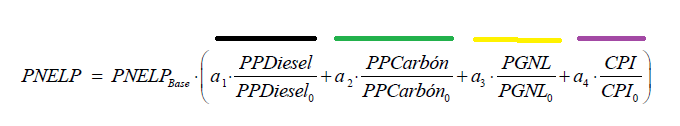

Otro ejemplo para aquellos datos que se encuentran con su precio final es para las licitaciones SIC 2015/02 y 2015/01, esto se debe a que tiene asociado un solo índice que correponde a CPI 6 meses.

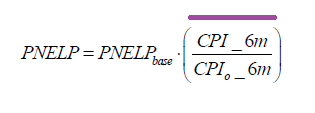

Entonces se debe tener cuidado con aquellas licitaciones que tienen asociadas más de un tipo de índice.

# Variables
1. versionindex: Versión de indexación de los precios
2. mesindexacion: Mes de indexación de los precios
3. version: Versión de indexación dentro del modelo de precios
4. idlicitaciongx: id de la licitación  de generación
5. licitacion: Nombre de licitación
6. generadora: Nombre de empresa generadora
7. tipobloque: Tipo de bloque de suministro, puede ser bloque base o bloque variable
8. bloque: Bloque de sumistro de energía
9. ptooferta: Nombre de barra donde se calculó el precio ofertado
10. precioenergiabase: Precio base de energía
11. iddecrpnudo: id del decreto de precio nudo asociado al proceso de licitación
12. decpnudo: Nombre del decreto de precio de nudo de corto plazo asociado a la licitación
13. tipodecreto: Tipo de decreto de precio de nudo
14. tipoindex: Tipo de indexación de acuerdo a lo indicado en los procesos de licitación
15. index: Nombre del indexador
16. mesreferencia: Corresponde al mes que se considera como referencia para determinar la fecha base
17. rezago: Cantidad de meses que se deben restar o sumar a las fechas de referencia, base o actual según lo indicado en la fórmula de cálculo de precio
18. ponderador: Es un valor que pondera el valor del indexador de acuerdo a lo indicado en la fórmula de calculo de precio de la licitación respectiva
19. fechabase: Mes de referencia menos el rezago para determinar el valor del indexador a utilizar
20. valorbase: Valor del indexador de acuerdo a la fecha base
21. fechaactual: Corresponde a la fecha de cálculo menos el rezago.
22. valoractual: Valor del indexador actual que se obtiene a partir de la fecha actual
23. factorindexacion: Corresponde al cuociente entre el valor actual y el valor base
24. precioindexadoponderado: Corresponde al precio base multiplicado por el factor de indexación y el ponderador
25. flagind: Indica si indexa o no
26. observacion: Observación asociada al cálculo del precio
27. created_at: Fecha de creación del registro
28. id: pk
29. tipoindexacion: Indica el tipo de indexación, si es tipo itd o mes
30. preciopotenciabase: Precio base de potencia

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
#Train data
from sklearn.model_selection import train_test_split
#FAMD
from prince import FAMD
#Normalization
from sklearn.preprocessing import StandardScaler
#Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

#Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import pandas_profiling as pp
from sklearn.model_selection import GridSearchCV

#  Carga y limpieza de datos

En primer lugar se carga el dataset que contiene las fechas de vigencias de las licitaciones, para obtener las licitaciones que ya expiraron o expirarán este año, con el fin de no proyectar precios vencidos.

In [66]:
ruta_py=os.path.dirname(os.path.abspath("__file__"))

In [67]:

nombre_vigencia='precios_com_reg_licitaciongx.csv'
nombre_data= 'precios_com_reg_indexacioncontratodetalle_202304052006.csv'

ruta_completa_vig=ruta_py+'//'+nombre_vigencia
ruta_completa_data= ruta_py+'//'+nombre_data


In [68]:
#Se carga archivo que contiene las vigencias
precios_com_reg_licitaciongx=pd.read_csv(ruta_completa_vig,sep=';')
precios_com_reg_licitaciongx.head()

,Unnamed: 0,idlicitaciongx,idlicitacion,licitacion,rexbases,iddecrpnudo,decpnudo,tipodecreto,modalidad,mesreferencia,...,idptooferta,ptooferta,tipobloque,bloque,precioenergia,vigenciainicio,vigenciafin,observacion,created_at,update_at
0,0,10,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1B,88.998,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
1,1,8,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1A,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
2,2,11,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1B,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
3,3,15,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1C,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
4,4,41,30,SIC 2013/03_2 (EMELECTRIC),533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1A,111.133,2016-01-01,2030-12-31,Agregado por Tarificación,2022-02-02 00:19:57.115012,2022-02-02 00:23:27


Se genera un nuevo dataset con los valores de las licitaciones, su fecha de inicio y de expiración.

In [69]:
#se genera un nuevo dataset solo con las fechas de vigencias y las licitaciones
vigencias= precios_com_reg_licitaciongx[['licitacion', 'vigenciainicio','vigenciafin']]
vigencias.head()

,licitacion,vigenciainicio,vigenciafin
0,SIC 2013/03_2,2016-01-01,2030-12-31
1,SIC 2013/03_2,2016-01-01,2030-12-31
2,SIC 2013/03_2,2016-01-01,2030-12-31
3,SIC 2013/03_2,2016-01-01,2030-12-31
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31


Se puede observar que las fechas no se encuentran en formato datatime de manera que requieren ser modififcadas.

In [70]:
vigencias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   licitacion      236 non-null    object
 1   vigenciainicio  236 non-null    object
 2   vigenciafin     236 non-null    object
dtypes: object(3)
memory usage: 5.7+ KB


Se transforman las fechas de inicio y fin de las vigencias a formato datatime para poder trabajarlas de mejor manera.

In [71]:
#se pasa a datatime las fechas de las vigencias
vigencias['vigenciainicio'] = pd.to_datetime(vigencias['vigenciainicio'])
vigencias['vigenciafin'] = pd.to_datetime(vigencias['vigenciafin'])

C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3530378407.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['vigenciainicio'] = pd.to_datetime(vigencias['vigenciainicio'])
C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3530378407.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['vigenciafin'] = pd.to_datetime(vigencias['vigenciafin'])


Se calcula el tiempo de las vigencias de los contratos. 

In [72]:
vigencias['tiempovigencia'] = (vigencias['vigenciafin']-vigencias['vigenciainicio']).astype('<m8[Y]')


C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\1191411901.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['tiempovigencia'] = (vigencias['vigenciafin']-vigencias['vigenciainicio']).astype('<m8[Y]')


In [73]:
vigencias.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
1,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
2,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
3,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0


Se chequea si hay elementos duplicados en la base de datos.

In [74]:
duplicate_rows = vigencias[vigencias.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (180, 4)


Se eliminan los duplicados.

In [75]:
vigencias=vigencias.drop_duplicates()
vigencias.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0
9,SIC 2013/03,2014-01-01,2025-12-31,11.0
11,SIC 2013/03 (EMELECTRIC),2014-01-01,2025-12-31,11.0
15,EMEL-SIC 2006/01-2 (EMELECTRIC),2010-01-01,2024-12-31,14.0


Por otro lado se genera un nuevo dataframe donde se eliminan los duplicados dejando solo las licitaciones en valores únicos, esto con el fin de graficarlas posteriormente.

Se eliminan los duplicados y se vuelve a comprobar su existencia.

In [76]:
vigencias_unicas=vigencias.drop_duplicates(subset='licitacion')
vigencias_unicas.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0
9,SIC 2013/03,2014-01-01,2025-12-31,11.0
11,SIC 2013/03 (EMELECTRIC),2014-01-01,2025-12-31,11.0
15,EMEL-SIC 2006/01-2 (EMELECTRIC),2010-01-01,2024-12-31,14.0


In [77]:
duplicate_rows = vigencias_unicas[vigencias_unicas.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 4)


Se filtran todas aquellas fechas cuyo vencimiento límite sea hasta final del año 2022, pues esos datos no requieren ser proyectados a futuro.

In [78]:
#Se filtran las vigencias vencidas
var=vigencias['vigenciafin'] <= '31-12-2022'
vigencias = vigencias[var]
vigencias.head()

C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3391736610.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  var=vigencias['vigenciafin'] <= '31-12-2022'


,licitacion,vigenciainicio,vigenciafin,tiempovigencia
16,EMEL-SIC 2006/01 (EMELECTRIC),2010-01-01,2019-12-31,9.0
17,CHL 2006/02,2011-01-01,2021-12-31,10.0
20,CHL 2006/01,2010-01-01,2020-12-31,10.0
22,CHL 2006/01,2010-01-01,2022-12-31,12.0
26,EMEL-SIC 2006/01 (EMETAL),2010-01-01,2019-12-31,9.0


In [79]:
vigencias.shape

(10, 4)

Se genera una lista con todas las licitaciones expiradas.

In [80]:
#se genera una lista con las licitaciones expiradas
licitacion_expirada= list(vigencias['licitacion'])

Se carga la base de datos a utilizar en el resto del trabajo.

In [81]:
indexacion_contratos=pd.read_csv(ruta_completa_data)
indexacion_contratos.head()

,versionindex,mesindexacion,version,idlicitaciongx,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,...,fechaactual,valoractual,factorindexacion,precioindexadoponderado,flagind,observacion,created_at,id,tipoindexacion,preciopotenciabase
0,240,2012-12-01,V1,76,CHL 2006/02,ENDESA,BV,BB1,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002867,Mes,7.2492
1,240,2012-12-01,V1,81,CHL 2006/02,ENDESA,BB,BB3,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002868,Mes,7.2492
2,240,2012-12-01,V1,82,CHL 2006/02,ENDESA,BV,BB3,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002869,Mes,7.2492
3,240,2012-12-01,V1,75,CHL 2006/02,ENDESA,BB,BB1,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002870,Mes,7.2492
4,240,2012-12-01,V1,123,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.99,...,2012-09-01 00:00:00.000,2.77,0.734748,39.275264,0,Agregado por Tarificación,2022-02-11 16:10:37.644,1002871,Mes,8.5659


Se da inicio con un dataset que contiene 109.974 filas y 30 columnas.

In [82]:
indexacion_contratos.shape

(109974, 30)

Se observa que todos los datos con enteros u object, las fechas no estan en formato datatime.

In [83]:
indexacion_contratos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109974 entries, 0 to 109973
Data columns (total 30 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   versionindex             109974 non-null  int64  
 1   mesindexacion            109974 non-null  object 
 2   version                  109974 non-null  object 
 3   idlicitaciongx           109974 non-null  int64  
 4   licitacion               109974 non-null  object 
 5   generadora               109974 non-null  object 
 6   tipobloque               109974 non-null  object 
 7   bloque                   109974 non-null  object 
 8   ptooferta                109974 non-null  object 
 9   precioenergiabase        109974 non-null  float64
 10  iddecrpnudo              109974 non-null  int64  
 11  decpnudo                 109974 non-null  object 
 12  tipodecreto              109974 non-null  object 
 13  tipoindex                109974 non-null  object 
 14  inde

Se revisa si hay datos duplicados en la base de datos, no encontrando datos duplicados.

In [84]:
duplicate_rows = indexacion_contratos[indexacion_contratos.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 30)


Se eliminan las licitaciones vencidas, quedando con un total de filas de 77.562, y 30 columnas.

In [85]:
for i in licitacion_expirada:
    indexacion_contratos.drop(indexacion_contratos[(indexacion_contratos['licitacion'] == i)].index, inplace=True)


indexacion_contratos.shape

(77562, 30)

In [86]:
porcentaje=(77562/109974)*100
print(f'El porcentaje de datos que se mantienen en la base es de {round(porcentaje,2)}%')

El porcentaje de datos que se mantienen en la base es de 70.53%


Se cuentan los valores nulos, en donde solo la variable observaciones tiene valores de este tipo, los cuales ascienden a 33.816.

In [87]:
# Let's count number of null entries per feature
missing_values = list(indexacion_contratos.isna().sum())
# missing values is a list of the number of missing values in each column

cols = list(indexacion_contratos.columns)
col_final = []
for i in range(len(cols)):
    if (missing_values[i] == 0):
        cols[i]="Others"
d = dict(zip(cols, missing_values)) # making a dicionary for the missing values

print("Number of Missing Values per feature >>")
missing_vals = pd.DataFrame(d, index=["Missing Values"]) # Making a custom dataframe from dict d
missing_vals.head()

Number of Missing Values per feature >>


,Others,observacion
Missing Values,0,33816


Se revisan los valores únicos para cada variable, con el fin de revisar si existen variables que solo tomen un valor. Se encuentra que las variables Flagind y Version tienen un solo valor que se repite para cada elemento de la tabla.

In [88]:
for i in indexacion_contratos.columns:
    u=indexacion_contratos[i].unique()
    print('--------------------------')
    print(i,':')
    print(u)

--------------------------
versionindex :
[240 292 262 241  25  23 242 323 322 243 244 245 263 246 247 248 249 250
 293 251 252  31 253 254 255 256 257 258 294 295 296 297 298 299 300 301
 302 303 304 305 306 307 308 309 310 311 312 144 313 314 315 316 317 318
 319 320 321  32  70  33 326 328 383 332 335 337 388 264 339 353 362 259
 364 205 206 207 208 209 210 211 212 260 213 214 215 216 217 218 219 220
 221 222 223 224 261 225 226 227 228 229 230 231 232 233 234 235 236 237
 238 239 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280
 281 282 283 284 285 286 287 288 289 290 291 377 368  34 379 373 375  30
  18  19  20  21 370  22  35  60  61  17  63  67]
--------------------------
mesindexacion :
['2012-12-01' '2017-04-01' '2014-10-01' '2013-01-01' '2021-06-01'
 '2020-07-01' '2013-02-01' '2019-12-01' '2019-11-01' '2013-03-01'
 '2013-04-01' '2013-05-01' '2014-11-01' '2013-06-01' '2013-07-01'
 '2013-08-01' '2013-09-01' '2013-10-01' '2017-05-01' '2013-11-01'
 '2013-12-01' '20

Se eliminan las columnas flagind y version debido a que es el mismo dato para cada fila del dataframe, el valor observacion y los id contenidos en la base, los cuales corresponden a id, idlicitaciongx, ididdecrpnudo  pues no son relevantes para el trabajo.

In [89]:
indexacion_contratos_2=indexacion_contratos.drop(['flagind'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['version'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['observacion'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['id'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['idlicitaciongx'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['iddecrpnudo'],axis=1)


Al analizar la definición de las variables se hace evidente la necesidad de eliminar las columnas created_at, que representa la fecha de creacion del archivo, y la columna version index, que es la versión del cálculo del índice, y no influyen en el cálculo del precio.

In [90]:
indexacion_contratos_2=indexacion_contratos_2.drop(['created_at'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['versionindex'],axis=1)

Se transforman las fechas a formato datatime.

In [91]:
indexacion_contratos_2[['mesindexacion', 'mesreferencia','fechaactual','fechabase']] = indexacion_contratos_2[['mesindexacion', 'mesreferencia','fechaactual','fechabase']].apply(pd.to_datetime, format='%Y-%m-%d')

In [92]:
indexacion_contratos_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77562 entries, 4 to 109973
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   mesindexacion            77562 non-null  datetime64[ns]
 1   licitacion               77562 non-null  object        
 2   generadora               77562 non-null  object        
 3   tipobloque               77562 non-null  object        
 4   bloque                   77562 non-null  object        
 5   ptooferta                77562 non-null  object        
 6   precioenergiabase        77562 non-null  float64       
 7   decpnudo                 77562 non-null  object        
 8   tipodecreto              77562 non-null  object        
 9   tipoindex                77562 non-null  object        
 10  index                    77562 non-null  object        
 11  mesreferencia            77562 non-null  datetime64[ns]
 12  rezago                   77562 

Al mesidexacion se le divide en año día y mes, y se elimina la variable mesindexacion, se repite el procedimiento para las otras fechas del dataframe.

In [93]:
indexacion_contratos_2['diaindexacion'] =indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoindexacion'] = indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesindexacion'] =indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%m'))


In [94]:
indexacion_contratos_2['diaactual'] =indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoactual'] = indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesactual'] =indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%m'))


In [95]:
indexacion_contratos_2['diareferencia'] =indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoreferencia'] = indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesreferencia'] =indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%m'))


In [96]:
indexacion_contratos_2['diabase'] =indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añobase'] = indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesbase'] =indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%m'))


In [97]:
indexacion_contratos_2=indexacion_contratos_2.drop(['fechaactual'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['fechabase'],axis=1)

Se visualizan aquellos datos que son únicos para conocer si varía cada variable.

In [98]:
for i in indexacion_contratos_2.columns:
    u=indexacion_contratos_2[i].unique()
    print('--------------------------')
    print(i,':')
    print(u)

--------------------------
mesindexacion :
['12' '04' '10' '01' '06' '07' '02' '11' '03' '05' '08' '09']
--------------------------
licitacion :
['EMEL-SING 2008/01' 'EMEL-SING 2008/01 (ELECDA)' 'CHQ 2006/01'
 'EMEL-SIC 2006/01-2 (EMELECTRIC)' 'EMEL-SIC 2006/01-2 (EMETAL)'
 'EMEL-SIC 2006/01-2' 'CHL 2006/02-2' 'CGED 2008/01' 'CHQ 2008/01'
 'SIC 2013/01' 'SIC 2013/01 (ENELSA)' 'CHQ 2010/01' 'CHL 2010/01'
 'SIC 2013/01 (EMETAL)' 'SIC 2013/01 (EMELECTRIC)' 'SIC 2013/03_2'
 '2015/02' 'SIC 2013/03_2 (EMETAL)' '2015/02 (ELECDA)'
 'SIC 2013/03_2 (ENELSA)' 'SIC 2013/03_2 (EMELECTRIC)' 'SIC 2013/03'
 'SIC 2013/03 (ENELSA)' 'SIC 2013/03 (EMELECTRIC)' 'SIC 2013/03 (EMETAL)'
 '2015/01']
--------------------------
generadora :
['E-CL' 'ENDESA' 'AES GENER' 'COLBÚN' 'CAMPANARIO' 'M. REDONDO'
 'PANGUIPULLI' 'PUYEHUE' 'SPV P4 S.A.' 'AMUNCHE SOLAR SPA'
 'ENERGÍA CERRO EL MORADO S.A.' 'IBEREOLICA CABO LEONES I S.A.'
 'CHUNGUNGO S.A.' 'SCB II SPA' 'EMPRESA ELÉCTRICA ERNC-1 SPA.'
 'SAN JUAN SPA.' 'AELA GEN

Se debe eliminar dia diaindexacion, diaactual y diareferencia pues tienen un único valor para cada fila del dataframe.

In [99]:
indexacion_contratos_2=indexacion_contratos_2.drop(['diaactual'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diareferencia'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diaindexacion'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diabase'],axis=1)

In [100]:
indexacion_contratos_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77562 entries, 4 to 109973
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mesindexacion            77562 non-null  object 
 1   licitacion               77562 non-null  object 
 2   generadora               77562 non-null  object 
 3   tipobloque               77562 non-null  object 
 4   bloque                   77562 non-null  object 
 5   ptooferta                77562 non-null  object 
 6   precioenergiabase        77562 non-null  float64
 7   decpnudo                 77562 non-null  object 
 8   tipodecreto              77562 non-null  object 
 9   tipoindex                77562 non-null  object 
 10  index                    77562 non-null  object 
 11  mesreferencia            77562 non-null  object 
 12  rezago                   77562 non-null  float64
 13  ponderador               77562 non-null  float64
 14  valorbase            

En conversación con el negocio, se explicó que los valores correspondientes a ITD no sirven para el cálculo, pues ellos solo necesitan la predicción para los meses, de manera que se filtra el mes.

In [101]:
var=indexacion_contratos_2['tipoindexacion'] == 'Mes'
indexacion_contratos_2 = indexacion_contratos_2[var]
indexacion_contratos_2.head()

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,tipoindex,...,factorindexacion,precioindexadoponderado,tipoindexacion,preciopotenciabase,añoindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
4,12,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
5,12,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
6,12,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
7,12,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
16,12,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,E3,...,1.175849,42.008249,Mes,6.9704,2012,2012,09,2006,2005,12


Además se menciona que aquellos tipoindex con valor P tampoco sirven para el cálculo de manera que también se filtran.

In [102]:
var2=indexacion_contratos_2['tipoindex'] != 'P'
indexacion_contratos_2 = indexacion_contratos_2[var2]
indexacion_contratos_2.head()

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,tipoindex,...,factorindexacion,precioindexadoponderado,tipoindexacion,preciopotenciabase,añoindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
4,12,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
5,12,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
6,12,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
7,12,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,0.734748,39.275264,Mes,8.5659,2012,2012,09,2009,2009,06
16,12,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,E3,...,1.175849,42.008249,Mes,6.9704,2012,2012,09,2006,2005,12


Se queda con un total de 22.683 filas.

In [103]:
indexacion_contratos_2.shape

(22683, 26)

In [104]:
porcentaje=(22683/109974)*100
print(f'El porcentaje de datos que se mantienen en la base es de {round(porcentaje,2)}%')

El porcentaje de datos que se mantienen en la base es de 20.63%


Se revisa que se hayan eliminado los valores ITD y P del dataset.

In [105]:
print(indexacion_contratos_2['tipoindexacion'].unique())
print(indexacion_contratos_2['tipoindex'].unique())


['Mes']
['E1' 'E3' 'E2' 'E4']


Se elimina el tipo index pues cada índice tiene un significado diferente dependiendo de la fórmula en la que se utiliza, no siempre hay relación entre el índice de una columna y el de otra.

In [106]:
indexacion_contratos_2=indexacion_contratos_2.drop(['tipoindex'],axis=1)

Se elimina la columna tipoindexacion pues solo está compuesta por el valor mes.

In [107]:
indexacion_contratos_2=indexacion_contratos_2.drop(['tipoindexacion'],axis=1)

Se restablecen los índices a predeterminados.

In [108]:
indexacion_contratos_2.reset_index(drop=True)

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,index,...,valoractual,factorindexacion,precioindexadoponderado,preciopotenciabase,añoindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
0,12,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,2.770,0.734748,39.275264,8.5659,2012,2012,09,2009,2009,06
1,12,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,2.770,0.734748,39.275264,8.5659,2012,2012,09,2009,2009,06
2,12,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,2.770,0.734748,39.275264,8.5659,2012,2012,09,2009,2009,06
3,12,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,2.770,0.734748,39.275264,8.5659,2012,2012,09,2009,2009,06
4,12,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,CPI,...,231.407,1.175849,42.008249,6.9704,2012,2012,09,2006,2005,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22678,11,SIC 2013/03_2 (EMETAL),E-CL,BB,BS3,POLPAICO 220,109.480,4T/2013,Decreto PN,GNL_6M,...,7.200,1.688555,21.259250,8.9176,2022,2022,08,2014,2014,09
22679,11,SIC 2013/03_2 (EMETAL),EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,7.200,1.690141,71.280507,8.9176,2022,2022,08,2014,2014,09
22680,11,SIC 2013/03_2 (ENELSA),EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,7.200,1.690141,71.280507,8.9176,2022,2022,08,2014,2014,09
22681,11,SIC 2013/03_2,EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,7.200,1.690141,71.280507,8.9176,2022,2022,08,2014,2014,09


Se tienen 24 columnas.

In [109]:
indexacion_contratos_2.shape

(22683, 24)

Se define un nuevo dataframe para posteriormente trabajarlo.

In [110]:
indexacion_contratos_3=indexacion_contratos_2.copy()

Se establecen los meses, años y días como tipo de dato numérico.

In [111]:
indexacion_contratos_3['mesindexacion']=indexacion_contratos_3['mesindexacion'].astype("int")
indexacion_contratos_3['añoindexacion']=indexacion_contratos_3['añoindexacion'].astype("int")
indexacion_contratos_3['añoactual']=indexacion_contratos_3['añoactual'].astype("int")
indexacion_contratos_3['mesactual']=indexacion_contratos_3['mesactual'].astype("int")
indexacion_contratos_3['añoreferencia']=indexacion_contratos_3['añoreferencia'].astype("int")
indexacion_contratos_3['mesreferencia']=indexacion_contratos_3['mesreferencia'].astype("int")
indexacion_contratos_3['añobase']=indexacion_contratos_3['añobase'].astype("int")
indexacion_contratos_3['mesbase']=indexacion_contratos_3['mesbase'].astype("int")

In [112]:
indexacion_contratos_3.columns

Index(['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
       'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto', 'index',
       'mesreferencia', 'rezago', 'ponderador', 'valorbase', 'valoractual',
       'factorindexacion', 'precioindexadoponderado', 'preciopotenciabase',
       'añoindexacion', 'añoactual', 'mesactual', 'añoreferencia', 'añobase',
       'mesbase'],
      dtype='object')

In [113]:
indexacion_contratos_3.columns = ['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
      'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto', 
      'indice', 'mesreferencia', 'rezago', 'ponderador',
      'valorbase', 'valoractual', 'factorindexacion',
       'precioindexadoponderado', 'preciopotenciabase', 'añoindexacion',
       'añoactual', 'mesactual', 'añoreferencia', 'añobase', 'mesbase']

#indexacion_contratos_3.columns

Se visualizan las componentes de la primera fila del dataframe.

In [114]:
row_1=indexacion_contratos_3.iloc[0]
row_1

mesindexacion                             12
licitacion                 EMEL-SING 2008/01
generadora                              E-CL
tipobloque                                BB
bloque                                   BS1
ptooferta                        CRUCERO 220
precioenergiabase                      89.99
decpnudo                            130/2008
tipodecreto                  Decreto PN SING
indice                                GNL_4M
mesreferencia                              9
rezago                                   3.0
ponderador                             0.594
valorbase                               3.77
valoractual                             2.77
factorindexacion                    0.734748
precioindexadoponderado            39.275264
preciopotenciabase                    8.5659
añoindexacion                           2012
añoactual                               2012
mesactual                                  9
añoreferencia                           2009
añobase   

Como fue puesto en contexto al inicio para realizar un análisis a la base de datos primero se tienen que trabajar los datos, teniendo que sumar aquellos precios indexados ponderados que se encuentran parcialmente calculados para obtener el valor final asociado a una licitación, bloque y generadora, para ello en primer lugar se debe transformar en variables dummy aquellas que varían para que no se pierdan datos al sumar las filas.

In [115]:
dummie_indice=pd.get_dummies(indexacion_contratos_3.indice,prefix='indice')
dummie_rezago=pd.get_dummies(indexacion_contratos_3.rezago,prefix='rezago')


Se concatenan las variables dummy.

In [116]:
concat=pd.merge(indexacion_contratos_3, dummie_rezago , left_index=True, right_index=True).merge(dummie_indice, left_index=True, right_index=True)

Se eliminan las variables antiguas, pues se utilizarán las dummy.

In [117]:
concat=concat.drop(['indice'],axis=1)
concat=concat.drop(['rezago'],axis=1)

Se tiene un total de 34 columnas.

In [118]:
concat.shape

(22683, 34)

Se visualiza si efectivamente se concatenaron las variables nuevas.

In [119]:
concat.columns

Index(['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
       'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto',
       'mesreferencia', 'ponderador', 'valorbase', 'valoractual',
       'factorindexacion', 'precioindexadoponderado', 'preciopotenciabase',
       'añoindexacion', 'añoactual', 'mesactual', 'añoreferencia', 'añobase',
       'mesbase', 'rezago_2.0', 'rezago_3.0', 'indice_BRENT_6M',
       'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M',
       'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M',
       'indice_GNL_6M'],
      dtype='object')

Luego se agrupan los datos según mes indexacion, año indexacion, licitacion, generadora, tipo bloque, bloque, decpnudo, tipo decreto, mes referencia y punto oferta, se suma el precio indexado ponderado, el ponderador y las variables dummy.

In [120]:
agrupado = concat.groupby(['mesindexacion','añoindexacion', 'licitacion', 'generadora', 'tipobloque','bloque','decpnudo','tipodecreto','mesreferencia', 'ptooferta']).agg(
                                  {'precioindexadoponderado': 'sum', 
                                   'ponderador':'sum', 
                                   'valorbase':'max',
                                   'valoractual':'max',
                                   'precioenergiabase':'max',
                                   'factorindexacion':'max',
                                   'añoactual':'max', 
                                   'mesactual':'max', 
                                   'añoreferencia':'max', 
                                   'añobase':'max', 
                                   'mesbase':'max',
                                   'rezago_2.0':'max',
                                   'rezago_3.0':'max', 
                                   'indice_BRENT_6M':'sum', 
                                   'indice_CARBÓN':'sum', 
                                   'indice_CARBÓN_6M':'sum',
                                   'indice_CPI':'sum', 
                                   'indice_CPI_4M':'sum', 
                                   'indice_CPI_6M':'sum', 
                                   'indice_CPI_9M':'sum',
                                   'indice_GNL':'sum', 
                                   'indice_GNL_4M':'sum', 
                                   'indice_GNL_6M':'sum'
                                  }).reset_index()

Se visualiza el nuevo dataframe.

In [121]:
agrupado.head()

,mesindexacion,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,ptooferta,...,indice_BRENT_6M,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M
0,1,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
1,1,2010,CGED 2008/01,CAMPANARIO,BV,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
2,1,2010,CGED 2008/01,COLBÚN,BB,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
3,1,2010,CGED 2008/01,COLBÚN,BV,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
4,1,2010,CGED 2008/01,ENDESA,BB,BS2,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0


In [122]:
agrupado.columns

Index(['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'precioindexadoponderado', 'ponderador', 'valorbase',
       'valoractual', 'precioenergiabase', 'factorindexacion', 'añoactual',
       'mesactual', 'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0',
       'rezago_3.0', 'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M',
       'indice_CPI', 'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M',
       'indice_GNL', 'indice_GNL_4M', 'indice_GNL_6M'],
      dtype='object')

Se verifica que el ponderador en todas las filas sume un total de 1.0 lo que indica que el agrupamiento se realizó correctamente.

In [123]:
print(agrupado['ponderador'].unique())

[1.]


A continuación se elimina, puesto que no aportará mayor información a los análisis posteriores.

In [124]:
agrupado=agrupado.drop(['ponderador'],axis=1)

Finalmente se tiene que la base de datos contiene 16.095 filas y 32 columnas.

In [125]:
agrupado.shape

(16095, 32)

# Análisis univariado

<b>Análisis variables dummy</b>

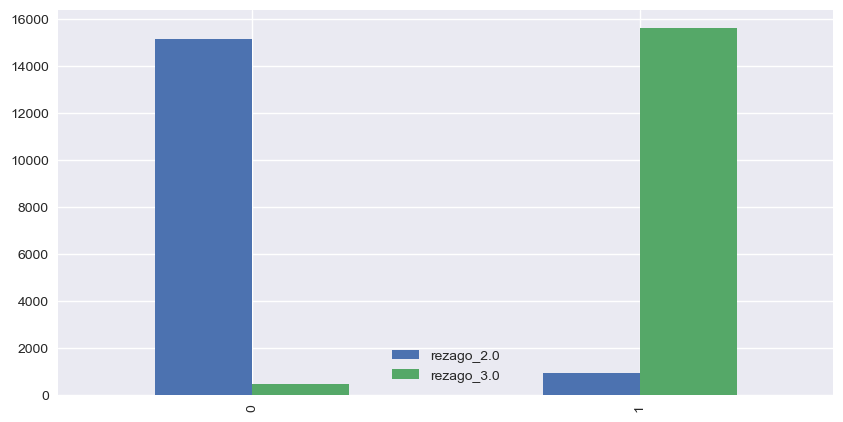

In [131]:
plt.style.use("seaborn-v0_8")
columns = ['rezago_2.0','rezago_3.0']
counts = agrupado[columns].apply(pd.Series.value_counts)
counts.plot(kind="bar",figsize=(10,5))
plt.show()

In [130]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

rezago no se suma, se elige el maximo

Se analizan aquellos índices con mayor presencia en la base de datos.

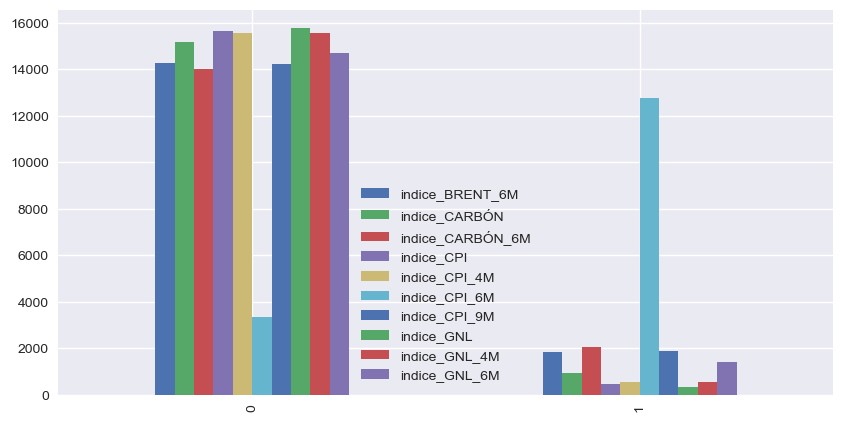

In [132]:
plt.style.use("seaborn-v0_8")
columns_indices = ['indice_BRENT_6M','indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M',
       'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M','indice_GNL_6M']
counts = agrupado[columns_indices].apply(pd.Series.value_counts)
counts.plot(kind="bar",figsize=(10,5))
plt.show()

Esta gráfica quiere decir que de todos los indices en la mayoría de las licitaciones se utiliza el ponderador de CPI 6 meses, el cual está asociado a formas nuevas de generar energía.

Se definen los colores que se utilizarán para los gráficos de mas adelante.

In [133]:
colores = ["#047fd1",  # Celeste
           "#ff0000"   # Rojo
          ]

Se agrupan los datos según generadora y se visualiza el porcentaje y tipo de índice presente en cada uno de ellos.

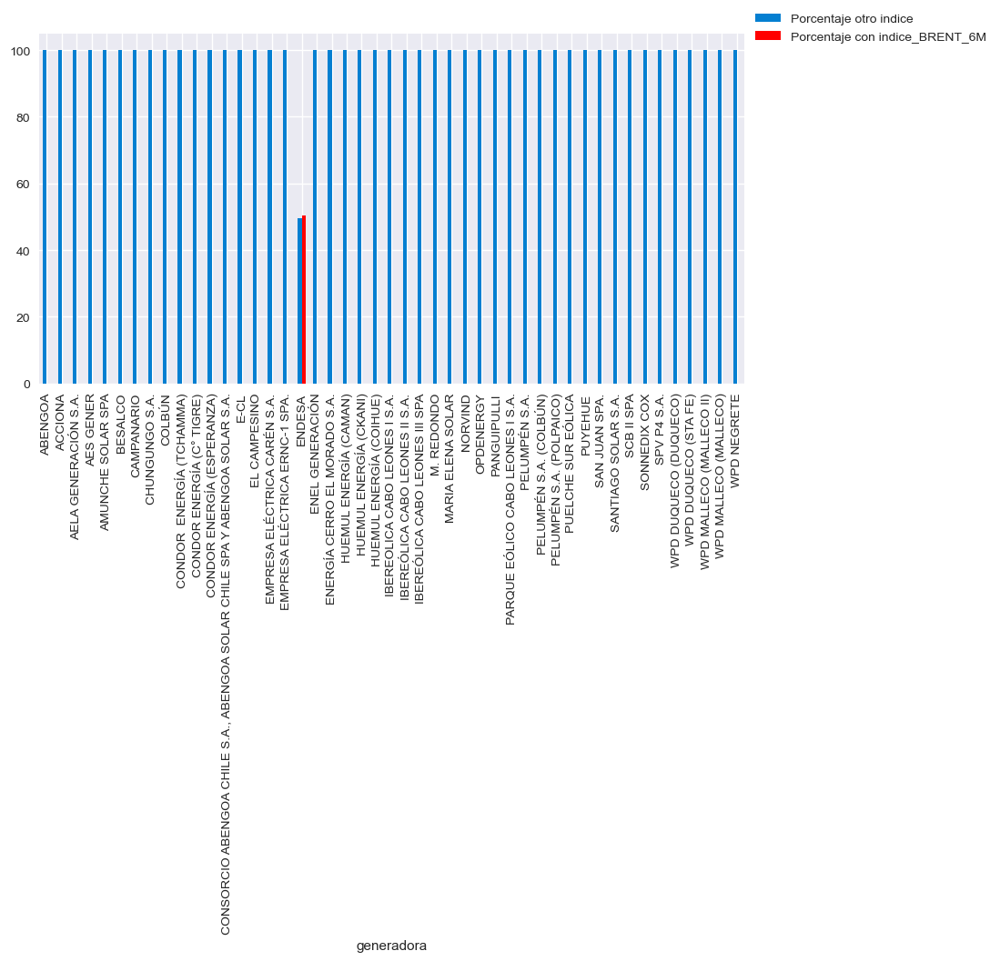

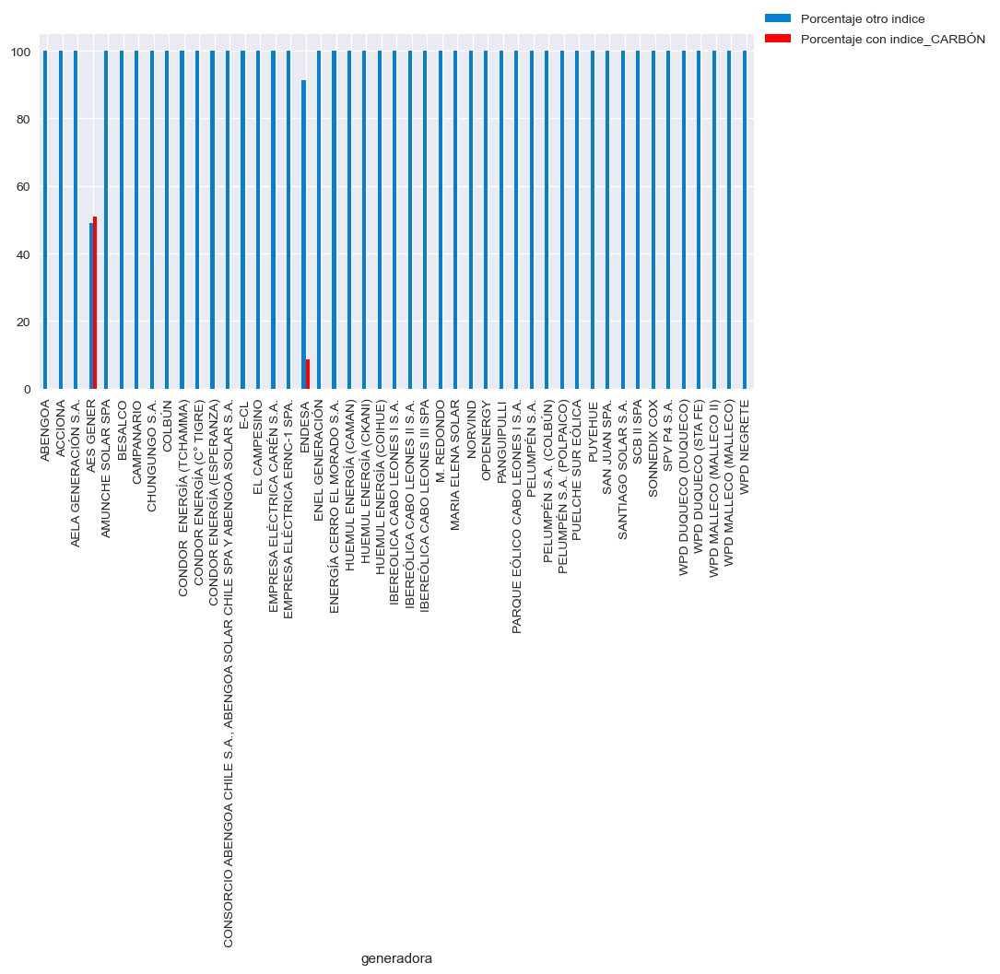

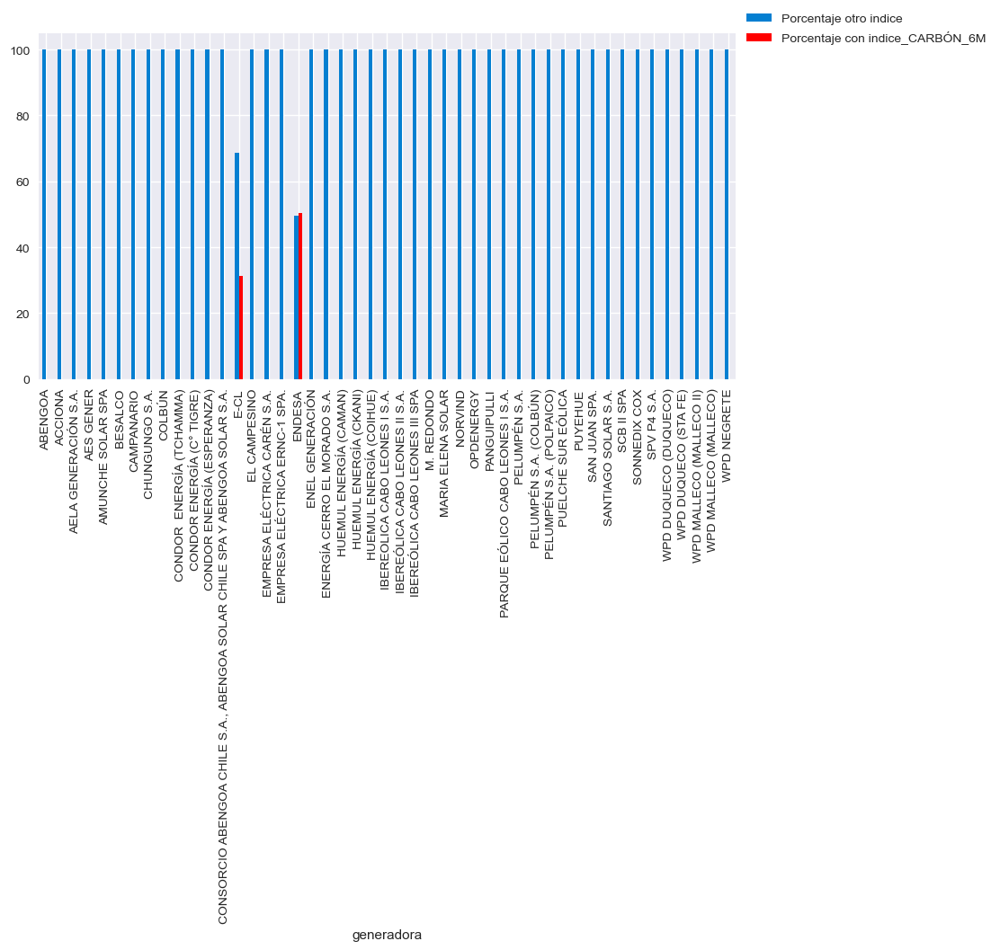

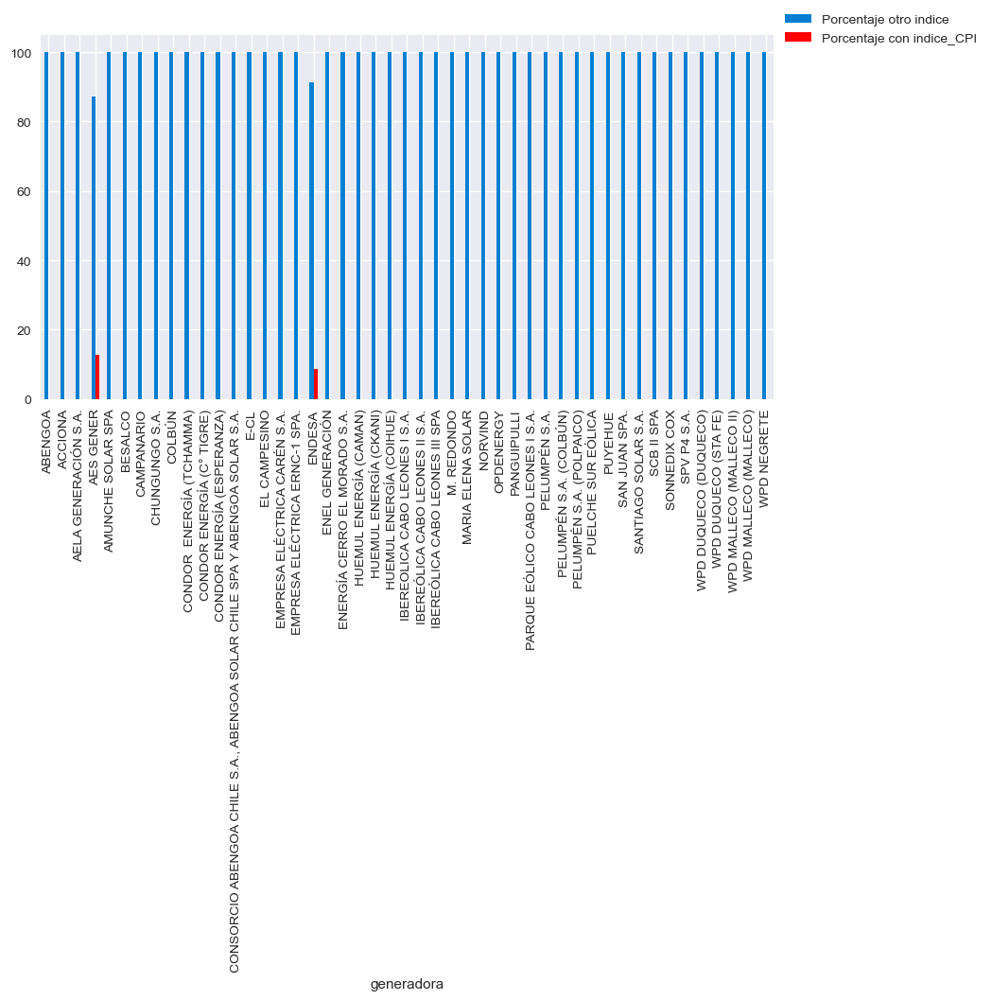

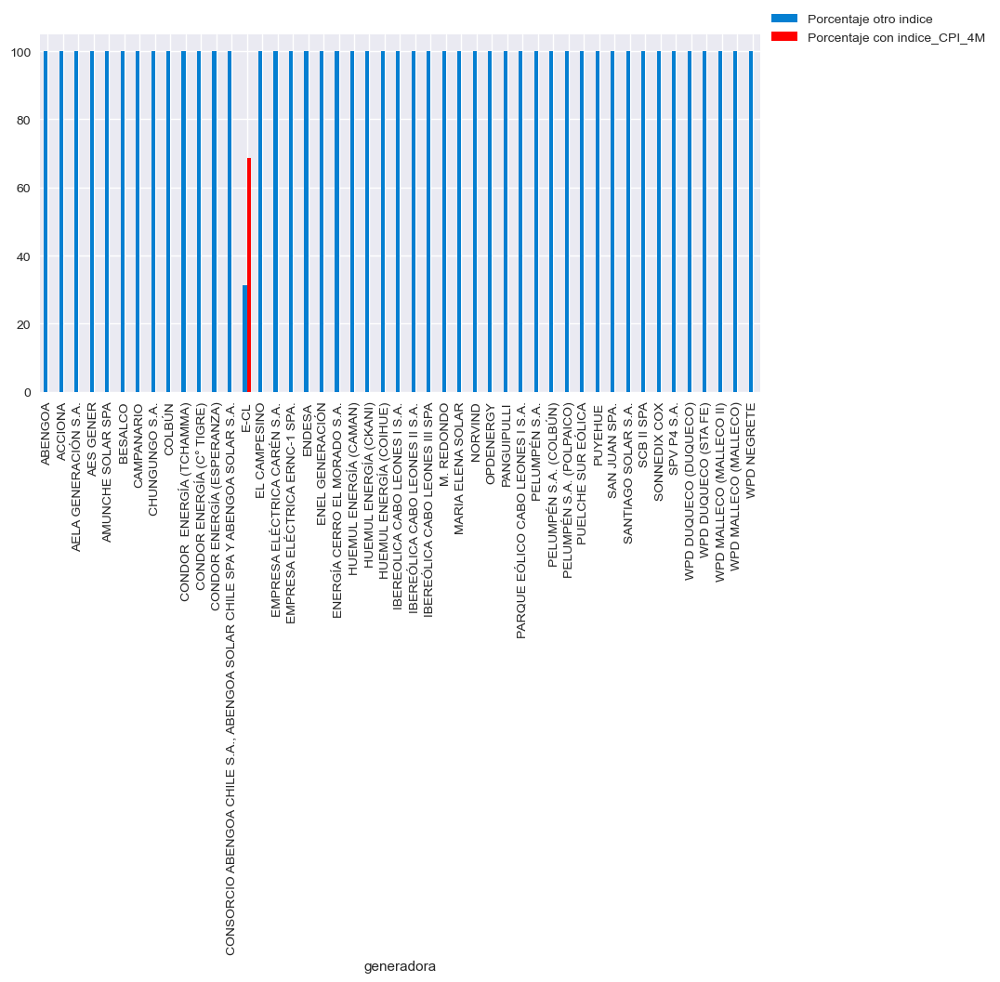

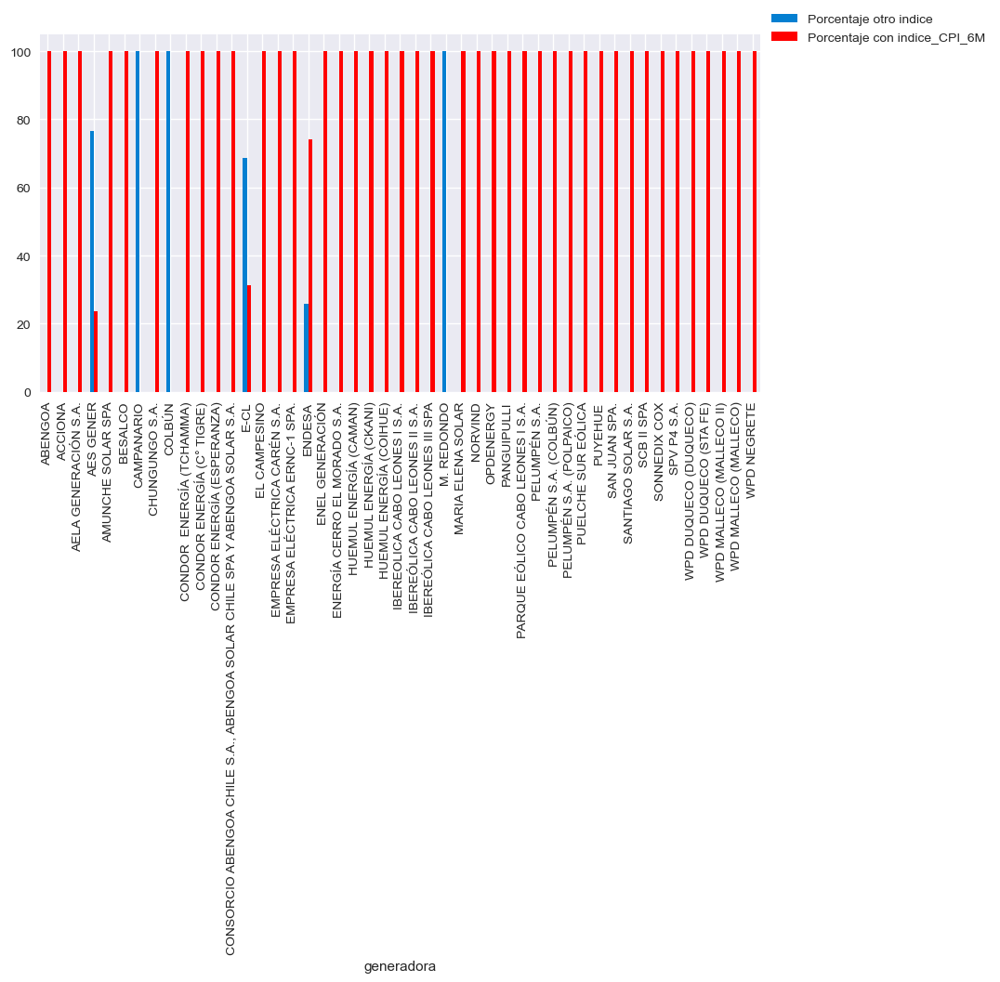

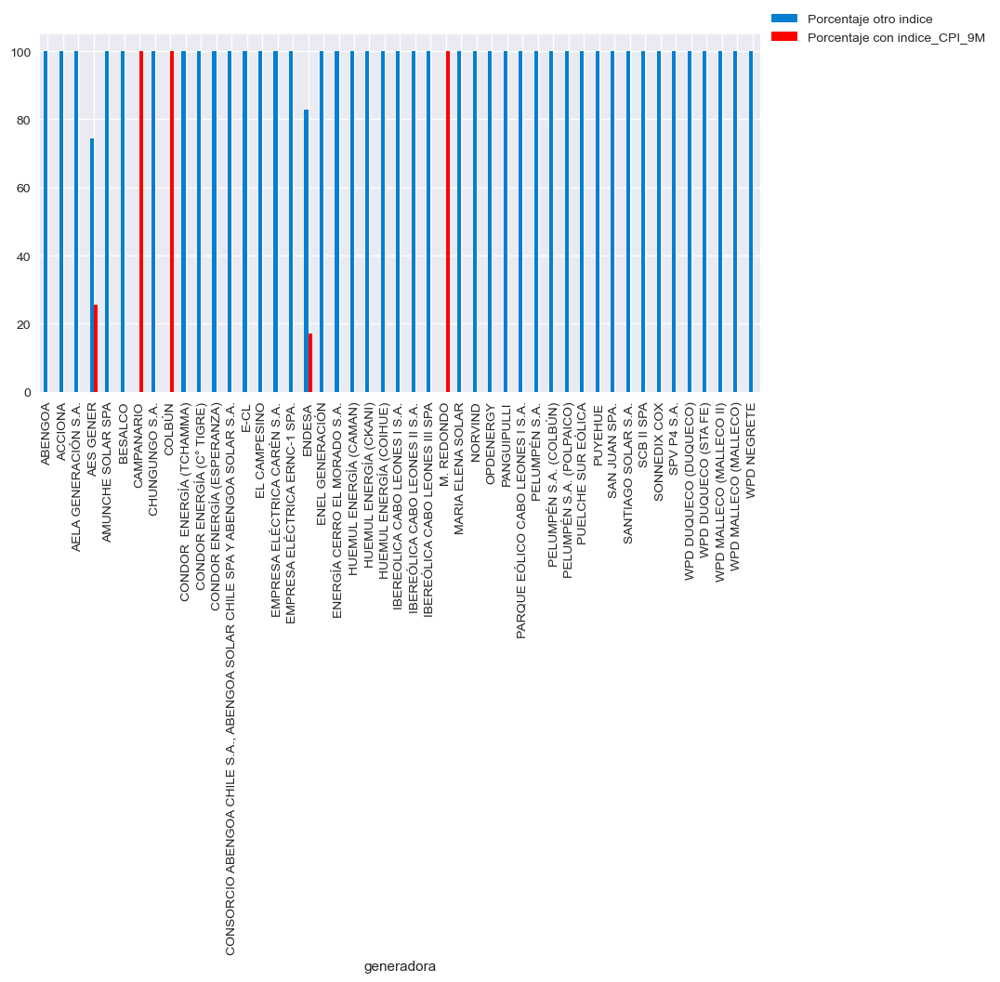

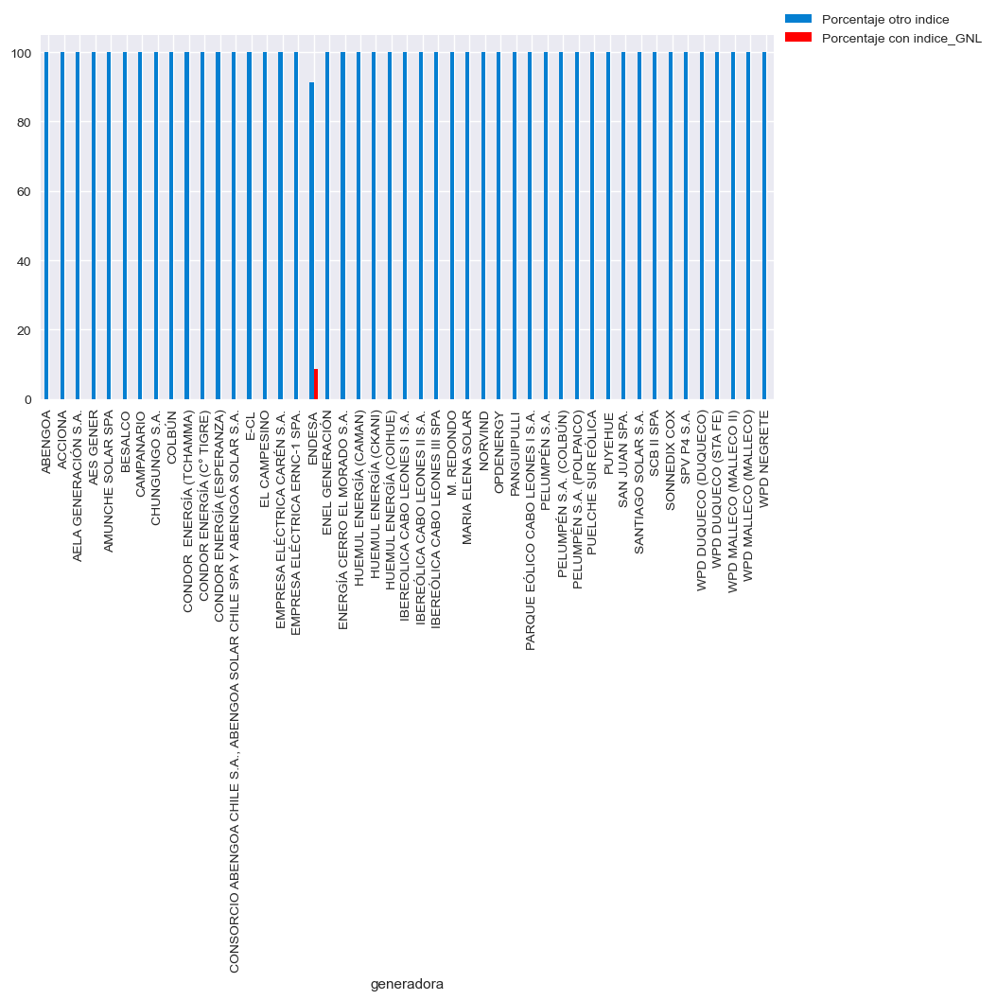

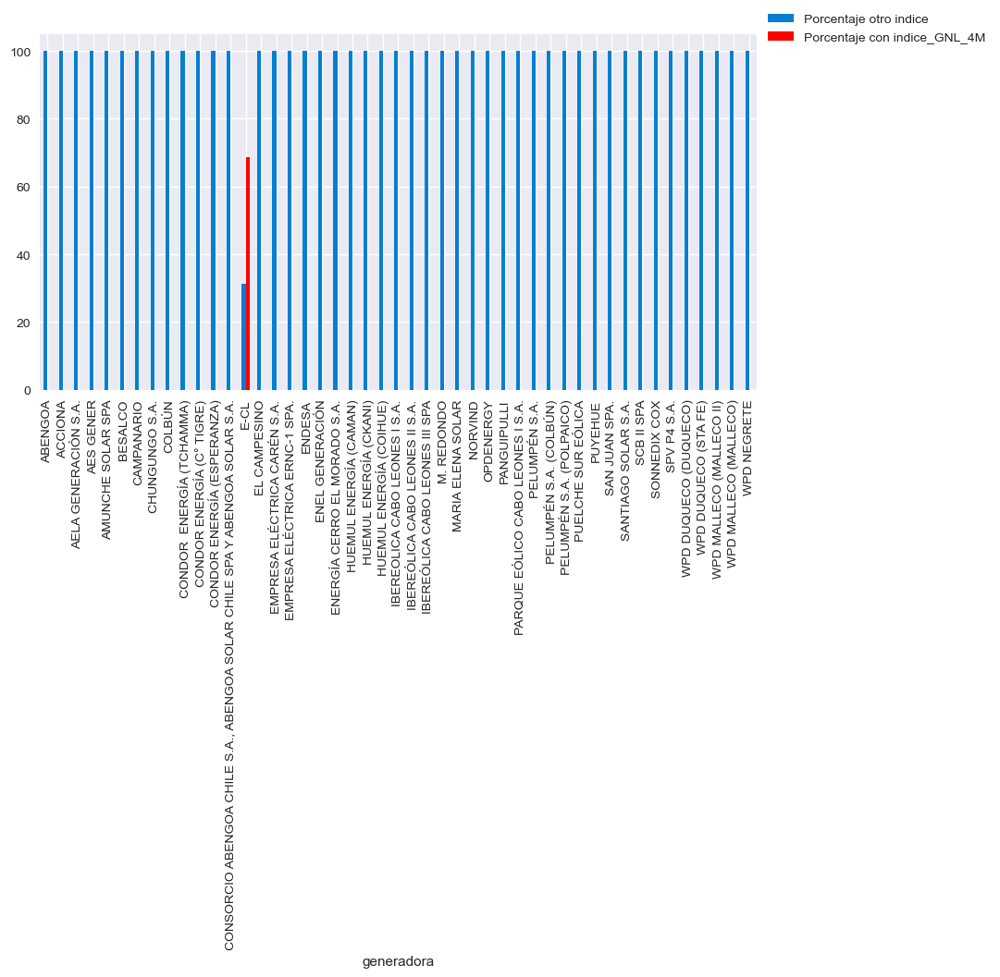

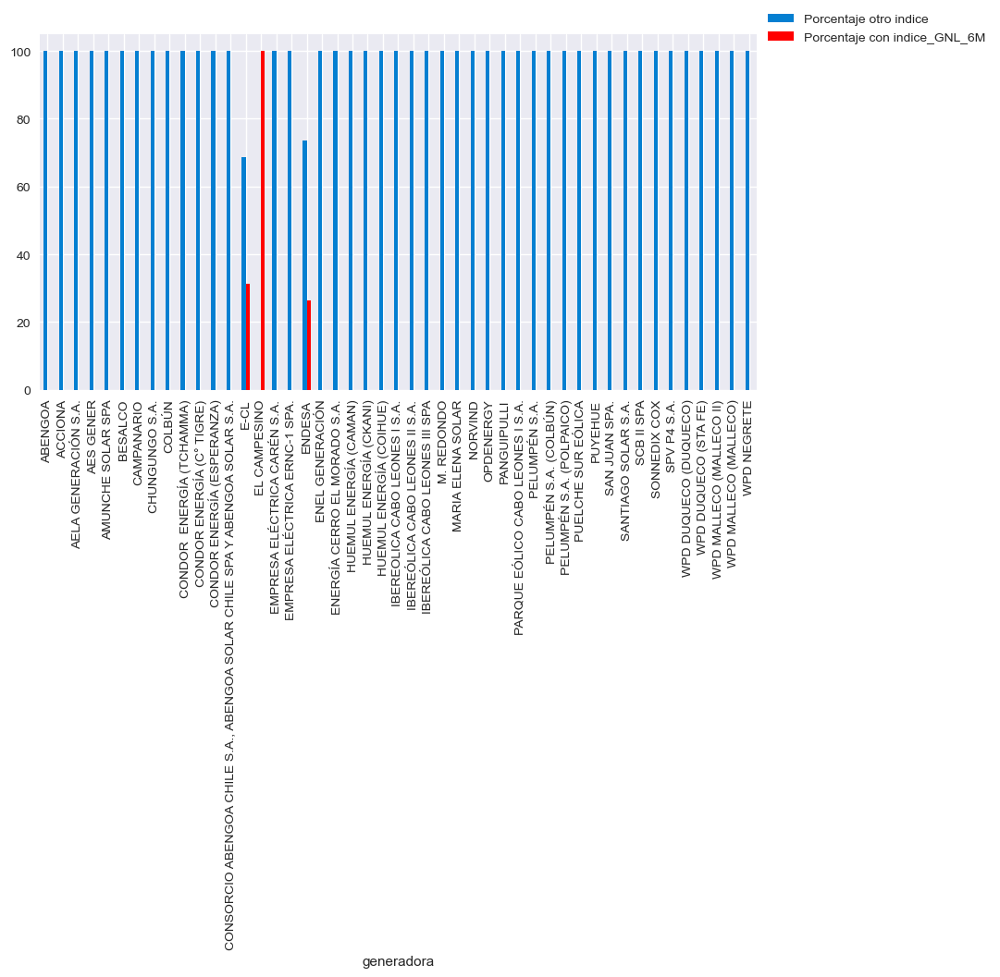

In [135]:
for i in columns_indices:

    plt.style.use("seaborn-v0_8")
    plot = pd.crosstab(index=agrupado['generadora'],
                columns=agrupado[i]).apply(lambda r: r/r.sum() *100,
                                                  axis=1).plot(kind='bar',figsize=(10,5),color=colores).legend([f"Porcentaje otro indice",f"Porcentaje con {i}"],  bbox_to_anchor=(1, 1.09), loc='upper left')

De los gráficos anteriores se desprende que:

*   Endesa es la única generadora que utiliza el índice BRENT 6 meses, CPI 4 meses y GNL.
*   Aes Gener y Endesa utilizan índice Carbón y CPI.
*   E-CL y Endesa utilizan Carbón 6 meses.
*   Todas las generadoras utilizan el índice CPI 6 meses, en menor proporción Aes Gener, E-cl, Endesa. Campanario, Colbún y M. Redondo no utilizan este índice.
*   Aes gener, Campanario, Colbún, Endesa y M. Redondo utilizan CPI 9 meses.
*   E-cl es la única generadora que utiliza GNL 4 meses y CPI 4 meses.
*   E-cl, El Campesino y Endesa utilizan GNL 6 meses.

En general Endesa es la generadora que mayor variación presenta en los índices.

<b>Análisis sin variables dummy</b>

Se trabaja con el dataframe sin considerar las variables dummy.

In [136]:
agrupado_sin_dummy=agrupado[['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'precioindexadoponderado',  'valorbase',
       'valoractual', 'precioenergiabase', 'factorindexacion', 'añoactual',
       'mesactual', 'añoreferencia', 'añobase', 'mesbase']]

Se visualiza la descripción de los datos.

In [138]:
agrupado_sin_dummy.describe()

,mesindexacion,añoindexacion,mesreferencia,precioindexadoponderado,valorbase,valoractual,precioenergiabase,factorindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
count,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000,16095.000000
mean,6.503075,2018.309226,8.318173,106.981934,224.945556,249.725789,98.243698,1.158999,2018.064306,6.526934,2012.362349,2012.130475,8.478658
std,3.452401,2.966194,4.159980,23.320114,29.266076,28.989776,21.698643,0.290776,2.993681,3.450840,2.655699,2.885819,2.392311
min,1.000000,2010.000000,1.000000,31.725587,67.920000,68.190000,29.100000,0.987333,2009.000000,1.000000,2006.000000,2006.000000,1.000000
25%,4.000000,2017.000000,3.000000,92.751779,218.576000,239.660000,88.411000,1.058072,2016.000000,4.000000,2011.000000,2010.000000,7.000000
50%,7.000000,2019.000000,10.000000,108.757018,235.502000,252.176000,100.646000,1.093078,2019.000000,7.000000,2014.000000,2014.000000,9.000000
75%,10.000000,2021.000000,12.000000,121.676500,237.908000,260.309000,112.000000,1.167658,2021.000000,10.000000,2014.000000,2014.000000,10.000000
max,12.000000,2022.000000,12.000000,327.502662,237.908000,377.330000,129.035000,5.555506,2022.000000,12.000000,2016.000000,2016.000000,12.000000


Se realiza una revisión de los estadísticos del data set para las variables numéricas, en donde se observa que los valores para la variable a predecir van desde los 31 hasta los 327, con una media de 106.

In [139]:
agrupado_sin_dummy.describe(include='object')

,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,ptooferta
count,16095,16095,16095,16095,16095,16095,16095
unique,26,47,2,19,7,2,4
top,CHQ 2010/01,ENDESA,BB,BS1,4T/2013,Decreto PN,POLPAICO 220
freq,1644,3624,12483,5235,6720,15567,11115


En el caso de las variables tipo object se tiene que la licitación que más se repite es la de CHQ 2010/01, mientras que la generadora con más apariciones es ENDESA, es importante notar que existen 26 licitaciones, 47 generadoras, 2 tipo bloque, 19 bloques, 4 puntos de oferta, 7 dcpnudo y 2 tipodecreto lo que da un total de 107 categorías totales en el dataset.

In [140]:
vigencias_unicas.describe()

,tiempovigencia
count,35.000000
mean,12.457143
std,2.693597
min,9.000000
25%,11.000000
50%,12.000000
75%,14.000000
max,19.000000


Con respecto a la vigencia de las licitaciones se observa que las licitaciones con mayor vigencia tienen 19 años de vigencia mientras las con menor vigencia tienen 9 años, siendo  2015/02 (ELECDS), 2015/02, 2015/01 las con mayor duración.

In [141]:
vigencias_unicas.tiempovigencia.value_counts()

14.0    10
11.0    10
9.0      5
13.0     4
19.0     3
10.0     2
12.0     1
Name: tiempovigencia, dtype: int64

Se tienen 3 licitaciones con el valor máximo de años, que es de 19 años de vigencia, mientras que se tienen 5 con la menor duración que corresponde a 9 años.

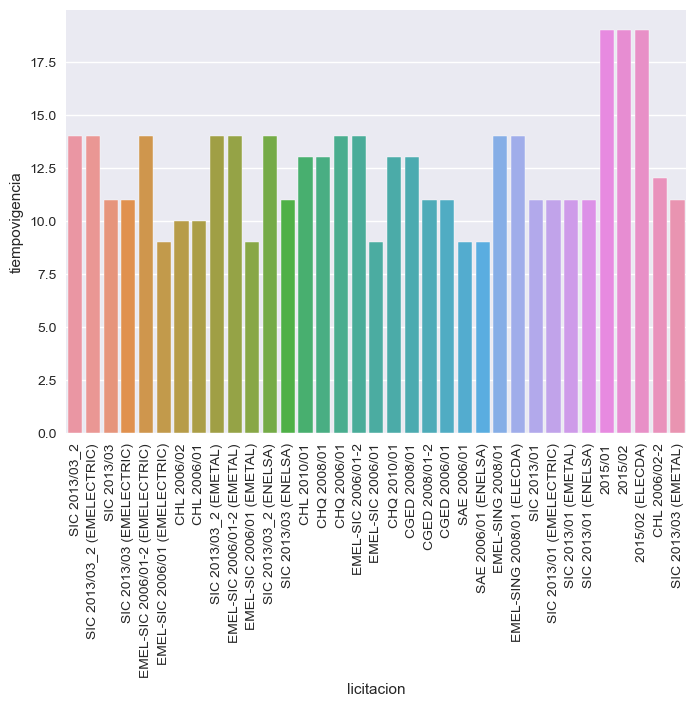

In [142]:
sns.set_palette('husl')
sns.set_style("darkgrid")
data=pd.DataFrame(vigencias_unicas,columns=['licitacion','tiempovigencia'])
v=sns.barplot(x = 'licitacion', y = 'tiempovigencia', data = data)
v.tick_params(axis='x', rotation=90)

En el gráfico se puede visualizar cómo se distribuyen los años según la licitación, siendo la mínima 9 y la máxima 19 años.

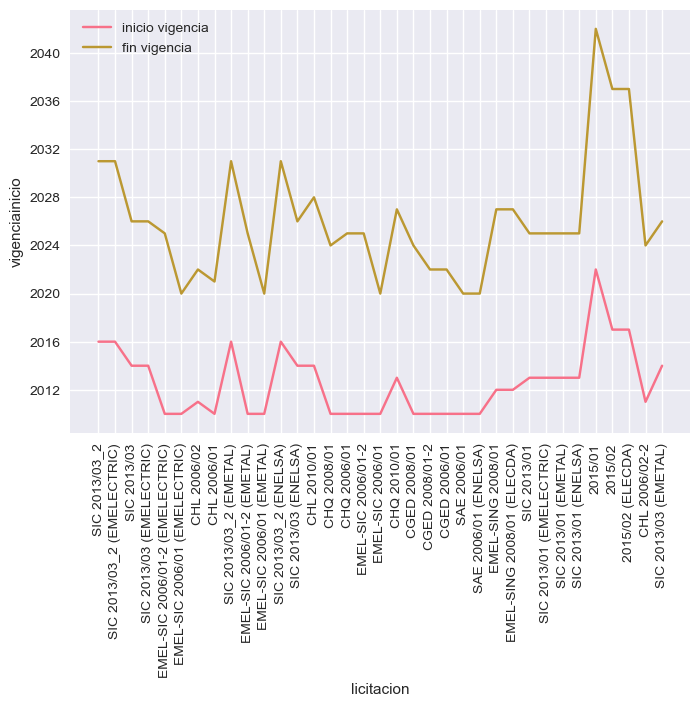

In [143]:
 #ax = vigencias_unicas.plot.barh(x='licitacion', y='vigenciainicio',figsize=(9,10))
#vigencias_unicas.plot( 'licitacion' , 'vigenciainicio',color="blue" )
sns.set_palette('husl')
a=sns.lineplot(x = "licitacion", y = "vigenciainicio", data = vigencias_unicas, label = "inicio vigencia");
b=sns.lineplot(x = "licitacion", y = "vigenciafin", data = vigencias_unicas, label = "fin vigencia");

plt.xticks(rotation=90)

sns.set(rc = {'figure.figsize':(8,6)})



En cuanto al año de inicio de las licitaciones se tiene que las más antiguas partieron el año 2010 y las más nuevas son del 2020, en el gráfico se puede observar como varía los años de inicio versus los años de finalización de las licitaciones, en donde las licitaciones con mayor proyección durarán hasta el 2040 aproximadamente.

In [144]:
indexacion_contratos_2.describe(include='object').columns

Index(['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
       'ptooferta', 'decpnudo', 'tipodecreto', 'index', 'mesreferencia',
       'añoindexacion', 'añoactual', 'mesactual', 'añoreferencia', 'añobase',
       'mesbase'],
      dtype='object')

Se genera un dataframe con las variables categóricas a graficar, se dejan aquellas que aportan al análisis dadas su características.

In [145]:
graf2=agrupado_sin_dummy[['licitacion', 'generadora', 'tipobloque', 'bloque', 'ptooferta']]

C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\954967425.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\954967425.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\954967425.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\954967425.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.xaxis.

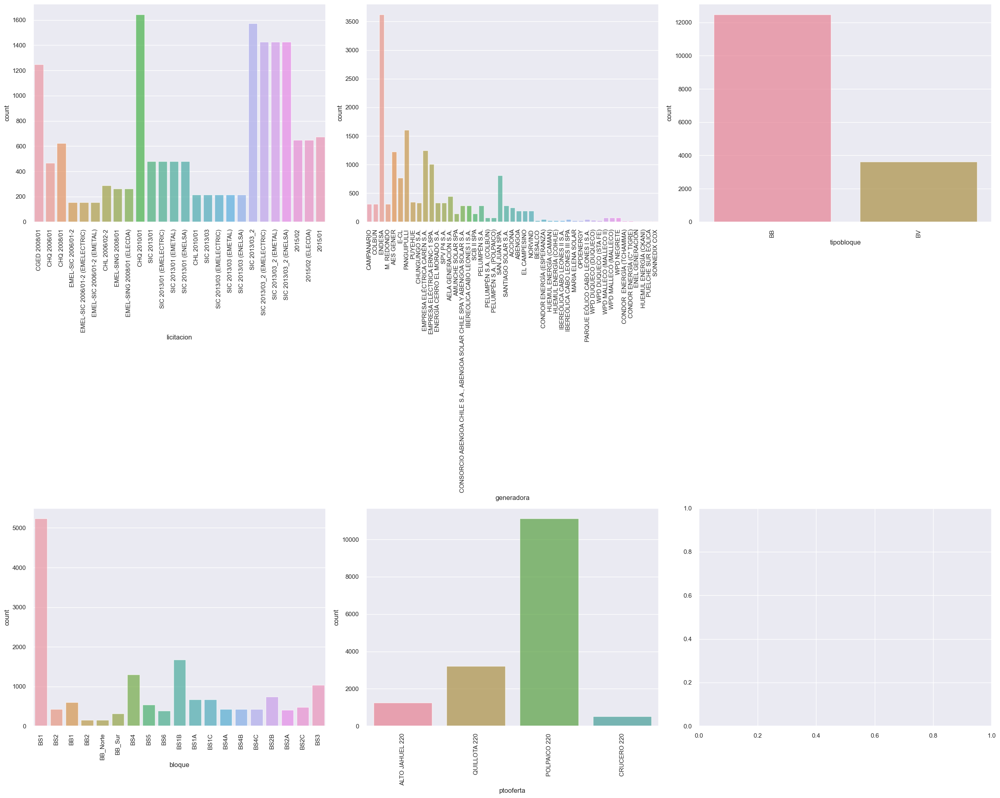

In [146]:
sns.set_palette('husl')
fig, axes = plt.subplots(round(len(graf2.columns) / 3), 3, figsize=(25, 20))

for i, ax in enumerate(fig.axes):
    if i < len(graf2.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
        sns.countplot(x=graf2.columns[i], alpha=0.7, data=graf2, ax=ax)

fig.tight_layout()

De los gráficos se desprende (de izquierda a derecha):

*   Gráfico 1: Dentro de la data la licitación con mayor aparición es CHQ 2010/01, lo cual puede deberse a que varias generadoras participen en esta licitaciones, sumado a los años que la licitación lleva activa.
*   Gráfico 2: La generadora que más se hace presente dentro de los datos es ENDESA, lo que probablemente tenga relación con que participa en mayor cantidad de licitaciones o que oferta más bloques que las demás generadoras.
*   Gráfico 3: De aquí se desprende que la mayoría ofertan en el bloque base, y esto se ve explicado porque antiguamente se solicitaba ofertar en el bloque base y bloque variable por separado con distinto precio, posteriormente se dejó de ofertar en bloque variable, ya que, el bloque variable se encuentra dentro del bloque base asumiendo que el 10% corresponde al bloque variable. Sería interesante analizar que licitaciones están trabajando con bloque variable y cuánto está variando el precio entre BB y BV.
*   Gráfico 4: Bloque suministro 1 es el con mayor presencia puesto que es un bloque base. 
*   Gráfico 5: La mayor cantidad se da en la barra POLPAICO probablemente debido a que que las generadoras han tomado como punto de conexión mayoritariamente esta barra.

Para un mejor entendimiento de las gráficas anteriores se graficarán los tipos de bloques agrupados por generadoras.

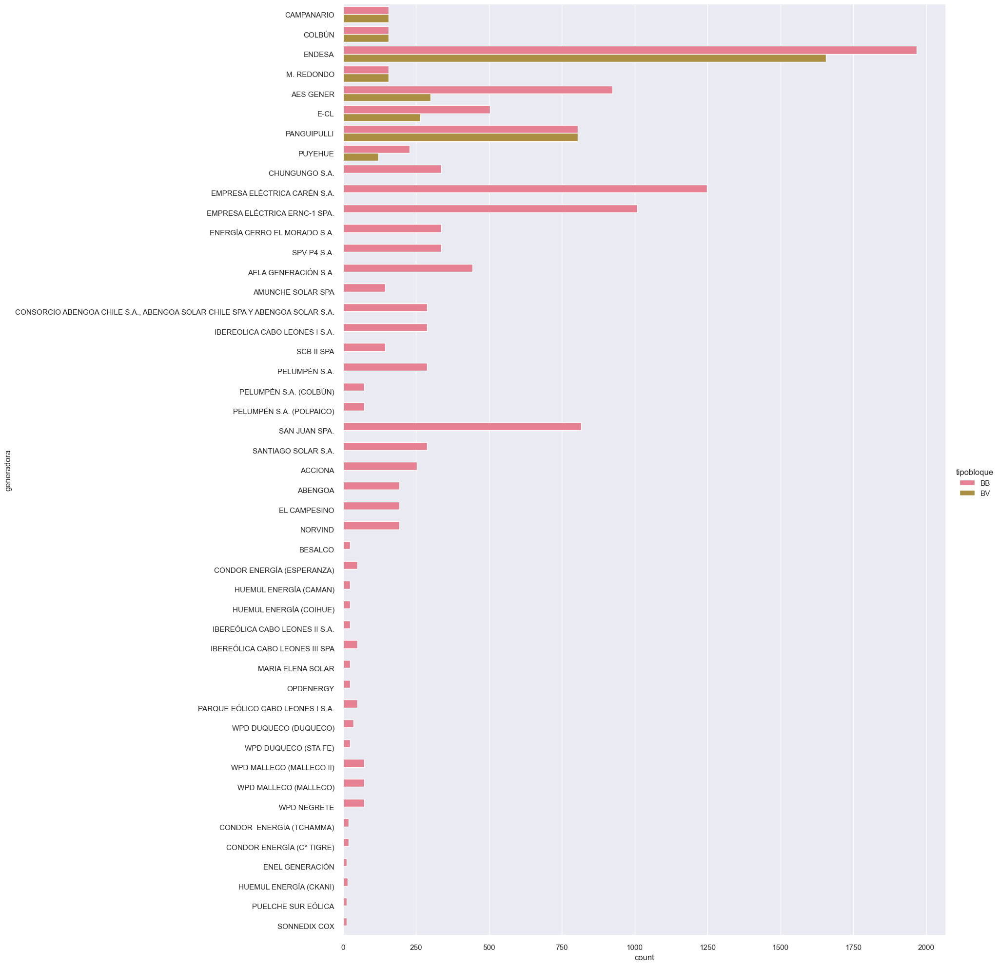

In [147]:
sns.set_palette('husl')
sns.catplot(y = "generadora", data = agrupado_sin_dummy, kind = "count", hue = "tipobloque", height=20)

En el siguiente gráfico se visualiza que la mayoría de las generadoras ofertan únicamente en el bloque base a excepción de E-CL, ENDESA, AES GENER, COLBÚN, CAMPANARIO, M. REDONDO, PANGUIPULLI y PUYEHUE.

A continuación se grafican las licitaciones asociadas a cada punto de oferta.

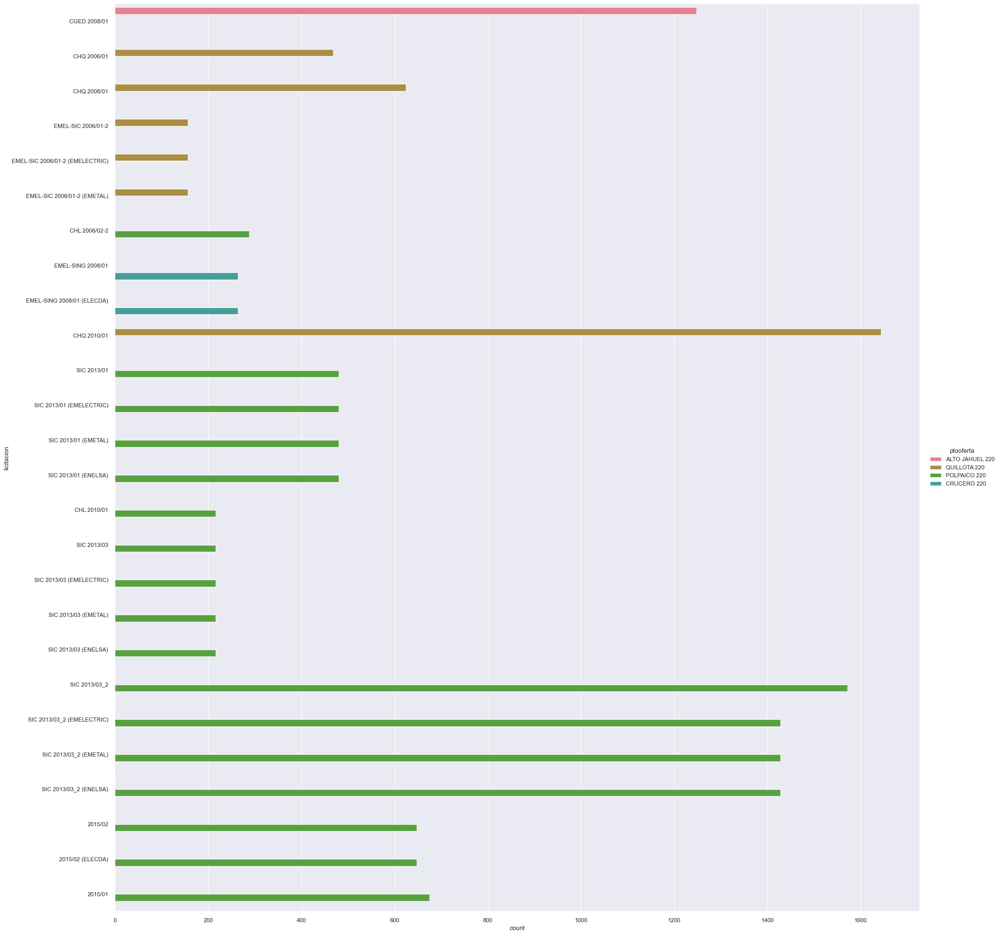

In [148]:
sns.set_palette('husl')
sns.catplot(y = "licitacion", data = agrupado_sin_dummy, kind = "count", hue = "ptooferta", height=25)

POLPAICO es la barra que más se utiliza en las licitaciones en general, sin embargo cabe considerar que en la licitación CHQ 2010/01 es el que presenta mayores punto de oferta que corresponden a QUILLOTA.

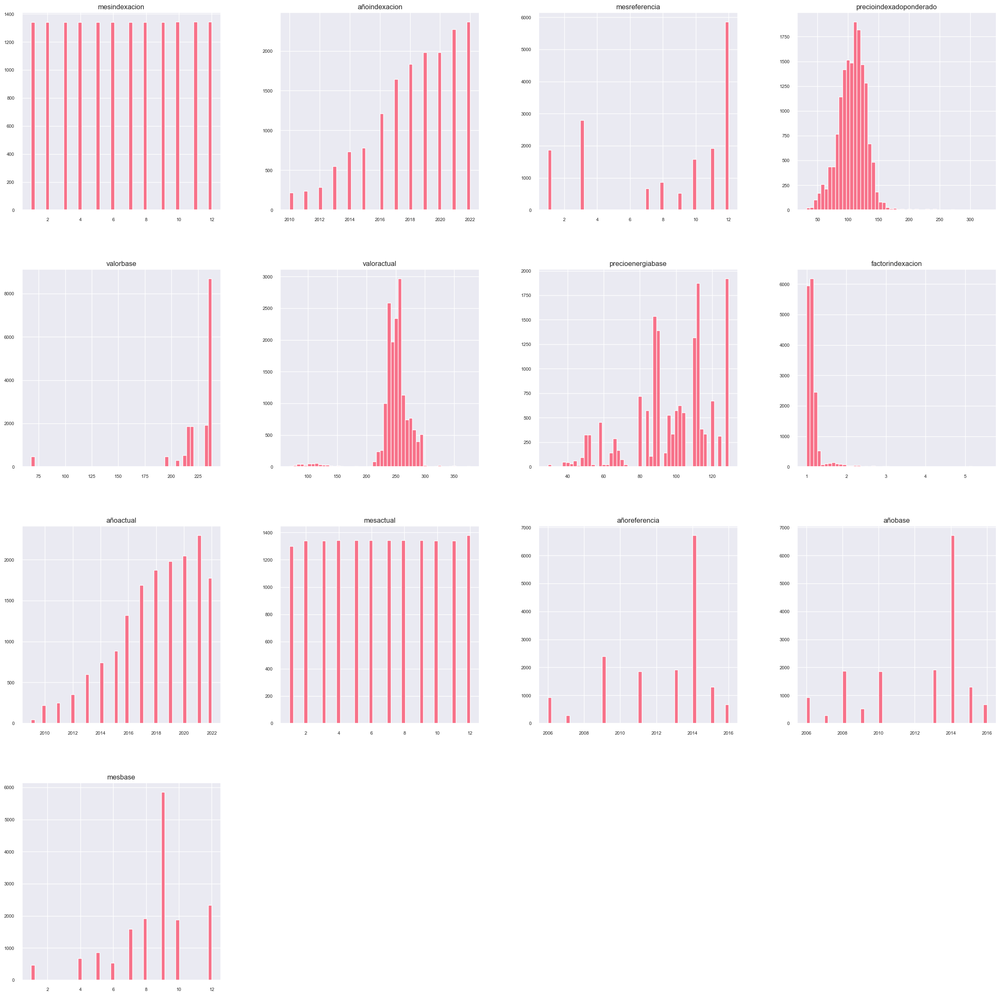

In [149]:
sns.set_palette('husl')
agrupado_sin_dummy.hist(figsize=(30, 30), bins=50, xlabelsize=8, ylabelsize=8);

En general ninguno de los histogramas presenta una distribución normal, en cuanto a un análisis un poco más profundo en cada uno de ellos se tiene:

*	Mes indexación: Puede tomar valores de 1 a 12, es decir de enero a diciembre ocurren los meses de indexación.
*	Año indexación: Puede tomar valores de 2010 a 2022.
*	Mes referencia: Los datos se encuentran mayormente agrupados en el mes de referencia de diciembre.
*	Precio indexado ponderado: En esta gráfica se visualizan posibles datos atípicos partir de 200, el pico de datos ocurre con un valor del precio indexado ponderado entre 100 y 150, no posee una distribución normal y la dispersión de los datos es desde aproximadamente los 45 a 250.
*	Valor base: El pico de datos ocurre cuando toma un valor base mayor a 225.
*	Valor actual: Se observan valores atípicos en 325 y también entre 100 y 150.
*	Precio energía base: Se observan múltiples picos.
*	Factor indexación: Se observa asimetría hacia la derecha y un outlier en 2.3 aproximadamente.
*	Año actual: Puede tomar valores de 2009 a 2022.
*	Mes actual: Puede tomar valores de 1 a 12.
*	Mes base: Presenta una dispersión de 1 a 12.

# Análisis Bivariado

In [150]:
corr = agrupado.corr()
cm = sns.color_palette("husl", as_cmap=True)
corr[['precioindexadoponderado']].sort_values(by = 'precioindexadoponderado',ascending = False).style.background_gradient(cmap = cm,axis=None)

C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3205369767.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = agrupado.corr()


,precioindexadoponderado
precioindexadoponderado,1.000000
precioenergiabase,0.768398
valoractual,0.242263
factorindexacion,0.177656
mesreferencia,0.169374
indice_CPI_9M,0.165578
añoactual,0.149390
añoindexacion,0.147110
valorbase,0.135167
indice_GNL_6M,0.133996


Revisando detenidamente las correlaciones con la variable a predecir se tiene que la correlación mas alta es con el precio energía base, esto tiene sentido pues se está considerando y calculando sólo aquellos precios con respecto a la energía y además estos valores son los que participan de manera directa en la fórmula de calculo del precio.

<Axes: xlabel='precioenergiabase', ylabel='precioindexadoponderado'>

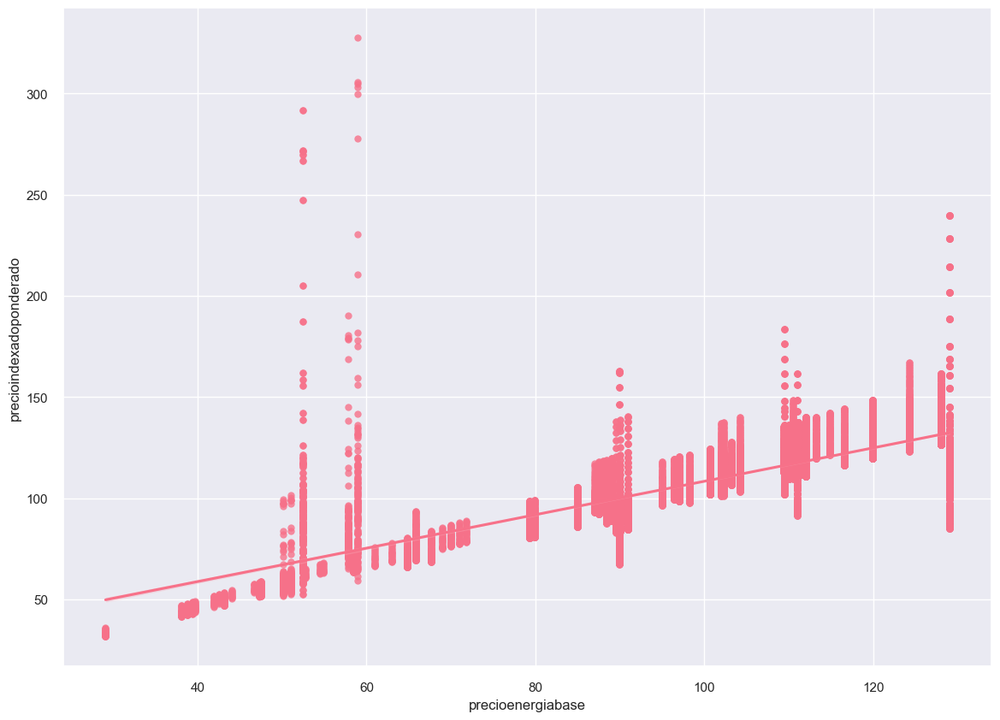

In [151]:
sns.set_palette('husl')
fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, figsize=(14,10))
OverallQual_scatter_plot = pd.concat([agrupado_sin_dummy['precioindexadoponderado'],agrupado_sin_dummy['precioenergiabase']],axis = 1)
sns.regplot(x='precioenergiabase',y = 'precioindexadoponderado',data = OverallQual_scatter_plot,scatter= True, fit_reg=True, ax=ax1)





Para el valor altamente correlacionado con la variable a predecir se tiene que la relación entre ellos es positiva.

Se grafican las variables versus el precioponderadoindexado

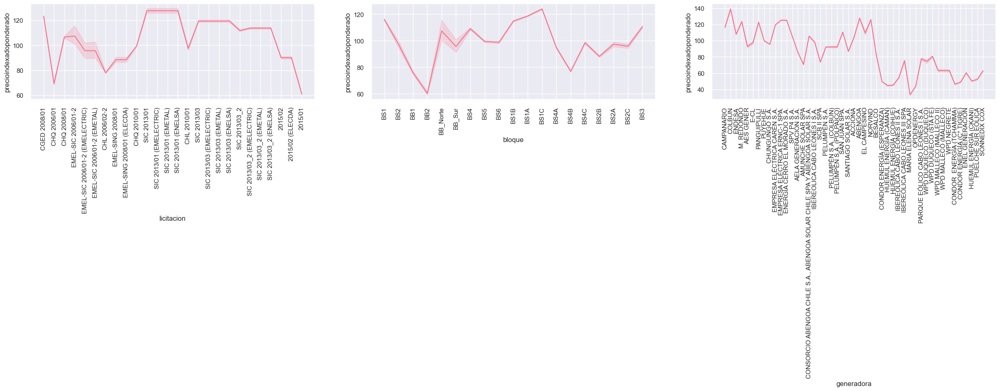

In [152]:
#sns.set(rc = {"axes.facecolor":"#FFFFFF", "figure.facecolor":"#ffffff"})
sns.set_palette('husl')
fig, axes = plt.subplots(1, 3, figsize = (30, 3))
axes = axes.flatten()

a=sns.lineplot(ax = axes[0], x = agrupado_sin_dummy["licitacion"], y = agrupado_sin_dummy["precioindexadoponderado"]);
b=sns.lineplot(ax = axes[1], x = agrupado_sin_dummy["bloque"], y = agrupado_sin_dummy["precioindexadoponderado"]);
c=sns.lineplot(ax = axes[2], x = agrupado_sin_dummy["generadora"], y = agrupado_sin_dummy["precioindexadoponderado"]);

a.tick_params(axis='x', rotation=90)
b.tick_params(axis='x', rotation=90)
c.tick_params(axis='x', rotation=90)


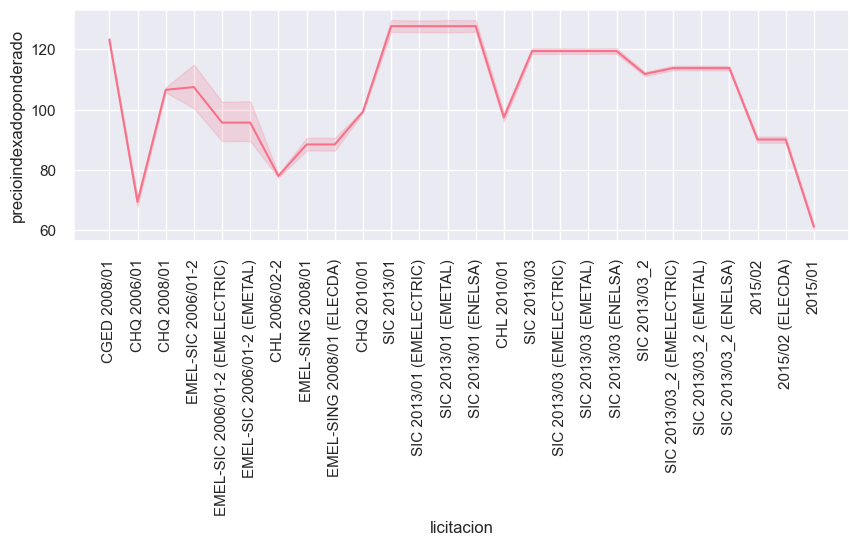

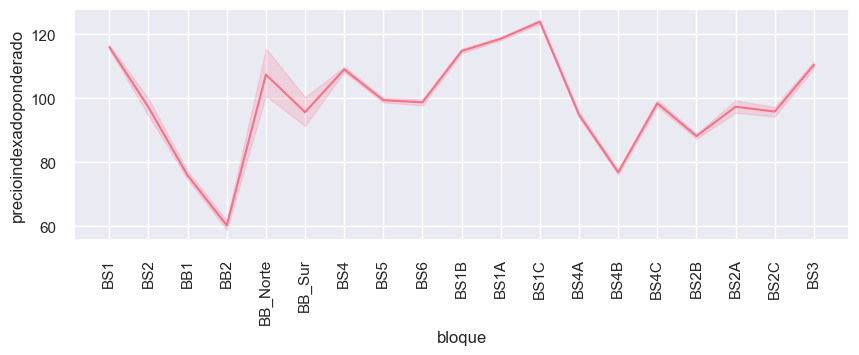

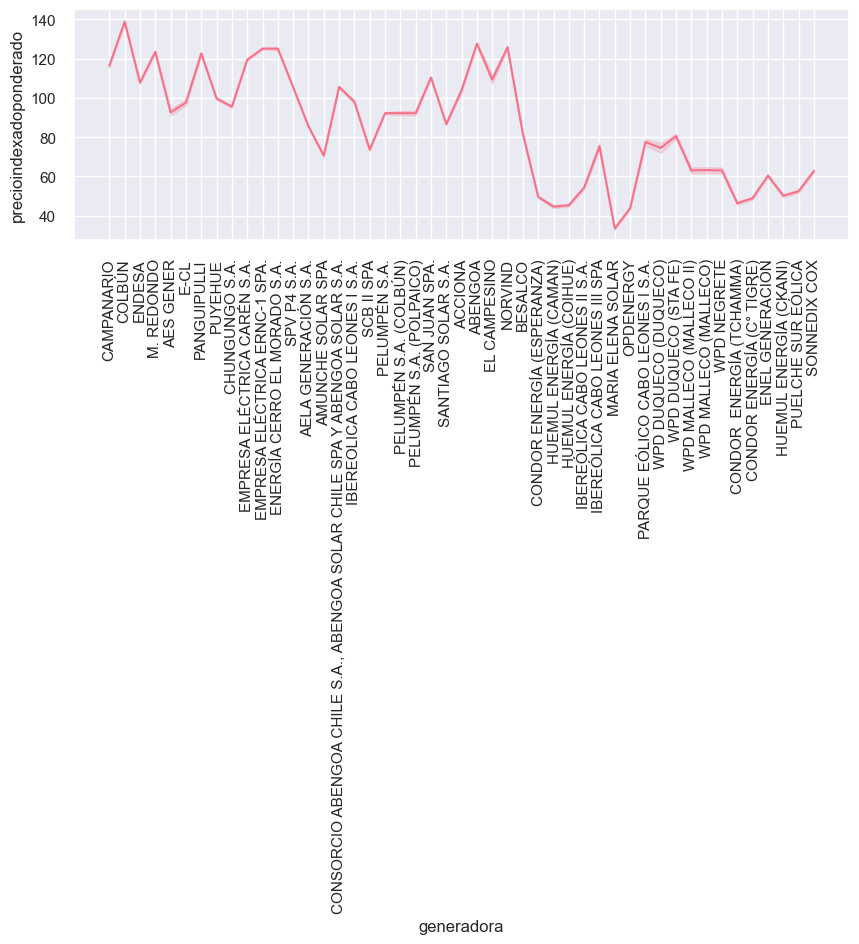

In [153]:
import seaborn as sns
import matplotlib.pyplot as plt

# Asegúrate de que 'agrupado_sin_dummy' esté definido correctamente
# agrupado_sin_dummy = ...

sns.set_palette('husl')

# Gráfico 1
plt.figure(figsize=(10, 3))
sns.lineplot(x=agrupado_sin_dummy["licitacion"], y=agrupado_sin_dummy["precioindexadoponderado"])
plt.xticks(rotation=90)
plt.show()

# Gráfico 2
plt.figure(figsize=(10, 3))
sns.lineplot(x=agrupado_sin_dummy["bloque"], y=agrupado_sin_dummy["precioindexadoponderado"])
plt.xticks(rotation=90)
plt.show()

# Gráfico 3
plt.figure(figsize=(10, 3))
sns.lineplot(x=agrupado_sin_dummy["generadora"], y=agrupado_sin_dummy["precioindexadoponderado"])
plt.xticks(rotation=90)
plt.show()


En los gráficos se pueden observar zonas con bandas lo cual representa la varianza de los datos, como por ejemplo en el caso de las licitaciones, en el tramo entre CHQ 2008/01 y CHL 2006/02-2, en el caso del bloque la banda se aprecia en BB_Sur y BB_norte.

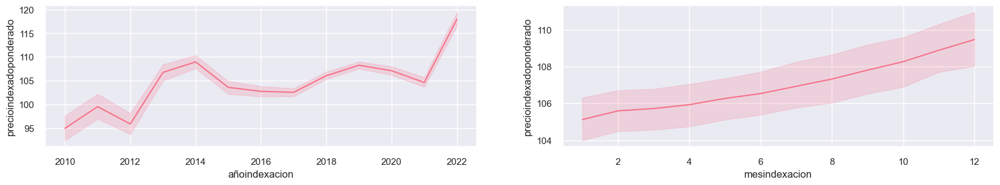

In [ ]:
#sns.set(rc = {"axes.facecolor":"#FFFFFF", "figure.facecolor":"#ffffff"})
sns.set_palette('husl')
fig, axes = plt.subplots(1, 2, figsize = (20, 3))
axes = axes.flatten()

sns.lineplot(ax = axes[0], x = agrupado_sin_dummy["añoindexacion"], y = agrupado_sin_dummy["precioindexadoponderado"]);
sns.lineplot(ax = axes[1], x = agrupado_sin_dummy["mesindexacion"], y = agrupado_sin_dummy["precioindexadoponderado"]);

En el caso del precioponderadoindexado versus el año y el mes de indexacion se tiene que la varianza de datos esta presente en toda la extensión de la curva.

A continuación se realiza un boxplot para revisar los posibles outliers.

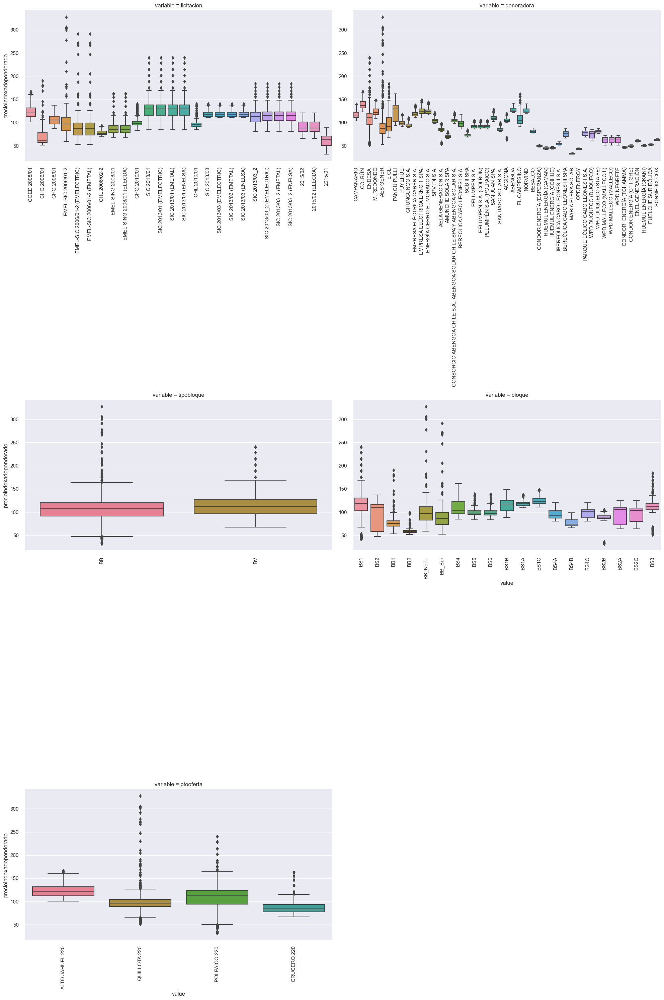

In [154]:
def boxplot(x, y, **kwargs):
    sns.set_palette('husl')
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(agrupado_sin_dummy, id_vars=['precioindexadoponderado'], value_vars=graf2)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, height=10)
g = g.map(boxplot, "value", "precioindexadoponderado")

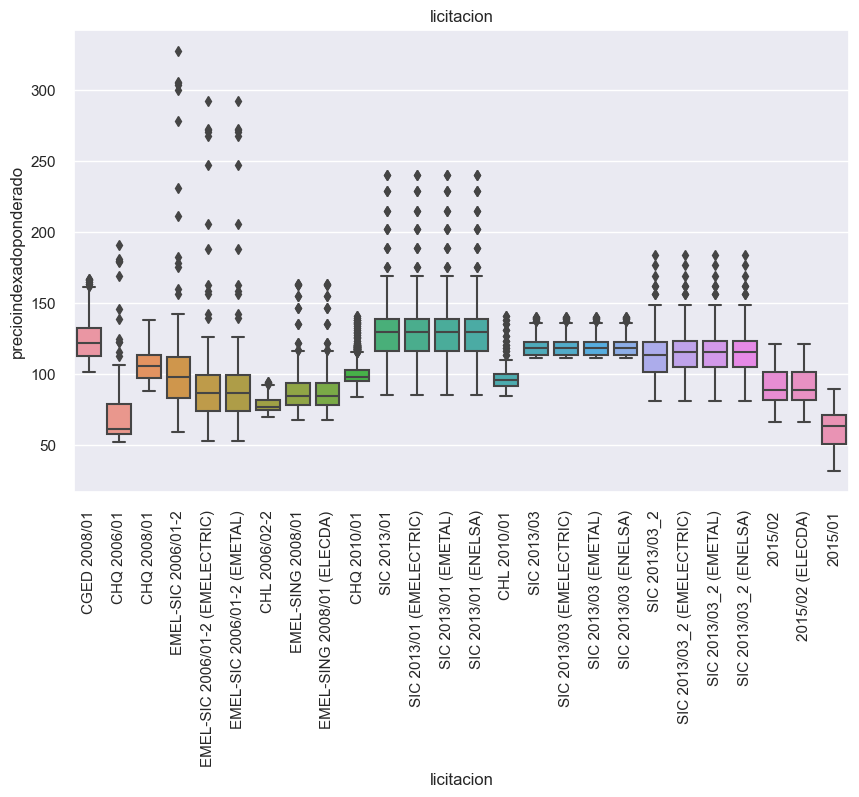

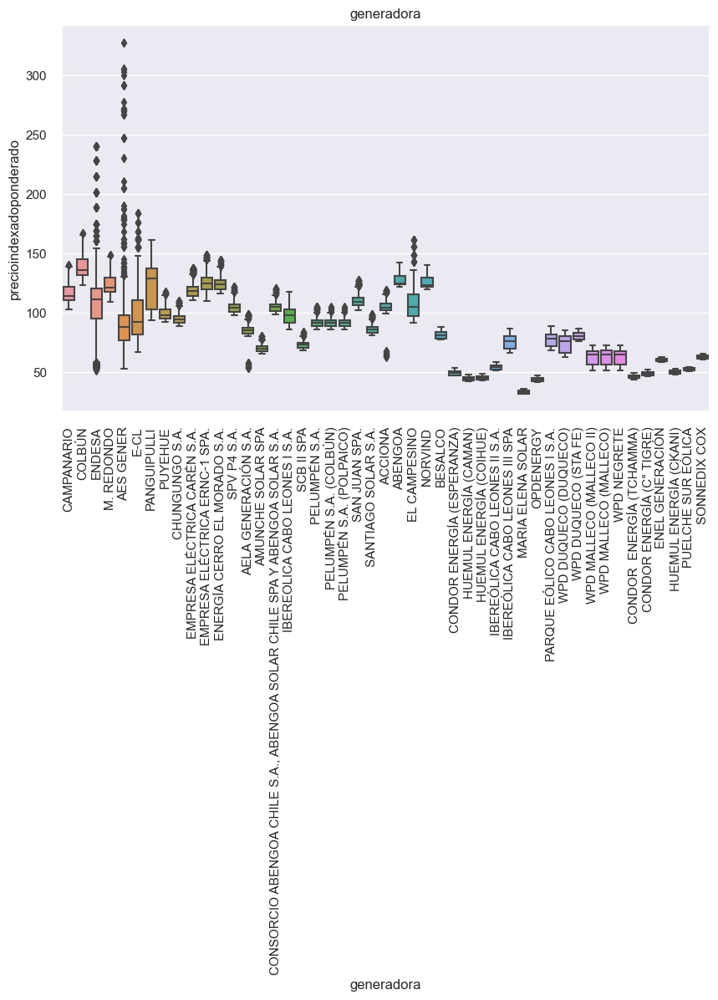

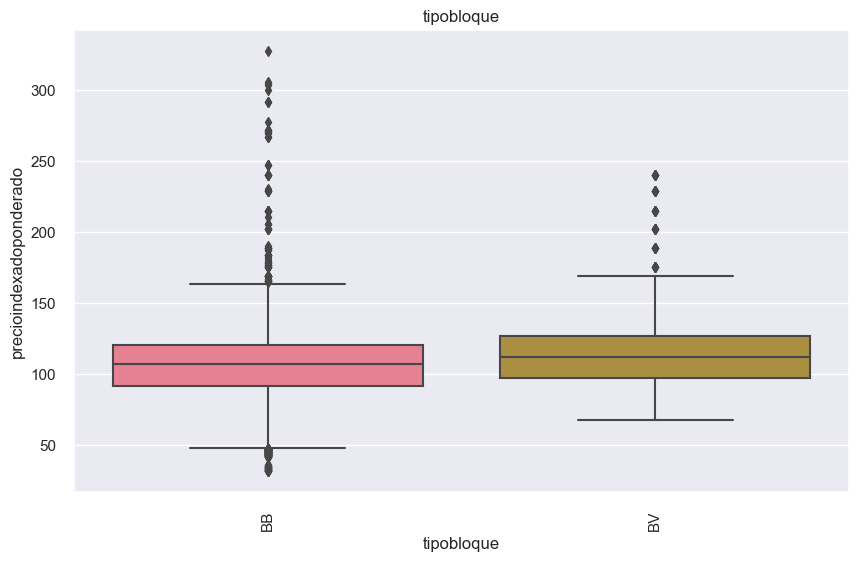

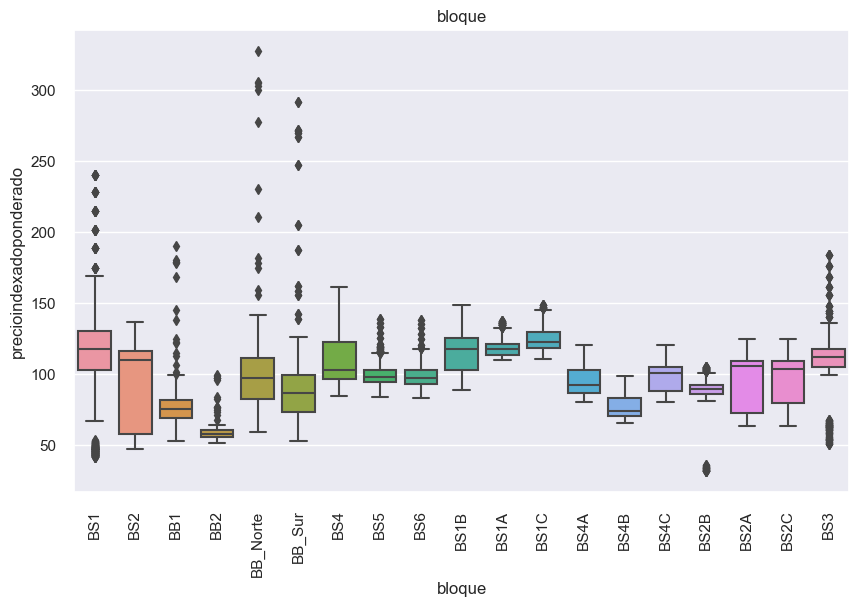

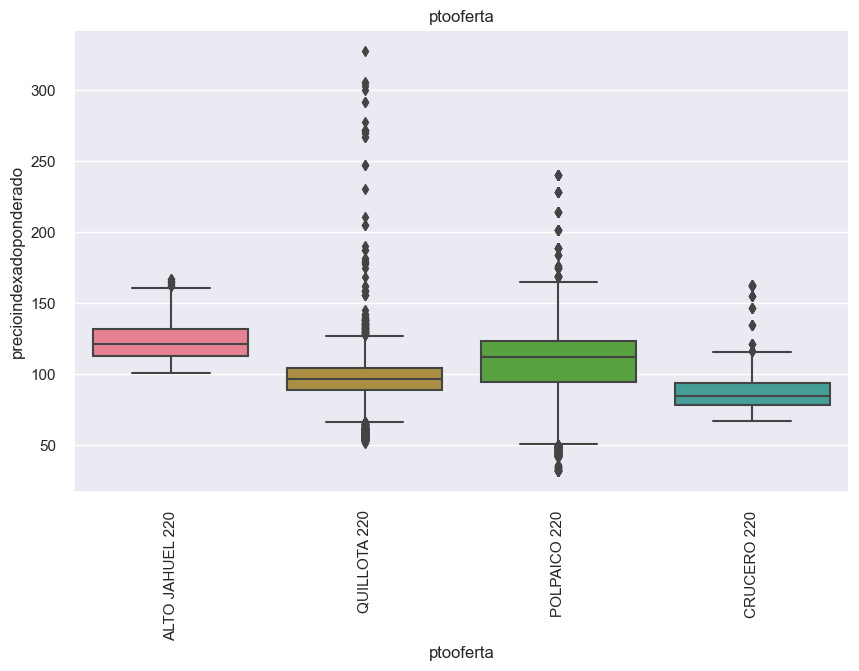

In [155]:

# Asegúrate de que 'agrupado_sin_dummy' y 'graf2' estén definidos correctamente
# agrupado_sin_dummy = ...
# graf2 = ...

sns.set_palette('husl')

# Función para crear un boxplot
def boxplot(data, x_var, y_var, title):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=x_var, y=y_var, data=data)
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

# Itera sobre cada variable y crea un boxplot
for variable in graf2:
    data_temp = agrupado_sin_dummy[[variable, 'precioindexadoponderado']]
    boxplot(data_temp, x_var=variable, y_var='precioindexadoponderado', title=variable)


Análisis:

*   Se encuentran outliers en el caso de las licitaciones para las mismas licitaciones, en donde se habian encontrado bandas.
*   La generadora con más outliers es la generadora AES Gener
*   La mayor parte de los outliers se encuentran en el bloque base, lo cual tiene sentido considerando que la mayor parte de los precios se encuentran en dicho bloque.
*   El BB_sur y BB_norte son los que tienen la mayor cantidad de outliers, estos eran los valores que presentaban bandas en el gráfico anterior.
*   La barra con más outliers es la Quillota 220, es probable que la generadora con más outliers se conecte a este barra para inyectar energia y por esto los valores de los precios asociados a esta barra sean altos.

GNL_4M

CPI: Consumer Price Index (USA), publicado por el Bureau of Labor Statistics of USA, cuyo valor se encuentra en el sitio web http://data.bls.gov/cgi-bin/srgate, clave “CUUR0000SA0”, identificación “CONSUMER PRICE INDEX-ALL URBAN CONSUMERS (CPI)”, o en su defecto, una nueva publicación que 
reemplace a la mencionada para efectos de la publicación de este índice. Se considera el índice correspondiente al tercer mes anterior 
al mes en el cual se evalúa la fórmula de indexación. 

CPI_4M:Promedio aritmético de los valores mensuales del Consumer Price Index (USA), publicado por el Bureau of Labor Statistics of USA, cuyo 
valor se encuentra en el sitio web http://data.bls.gov/cgi-bin/srgate,clave “CUUR0000SA0”, identificación “CONSUMER PRICE INDEXALL URBAN CONSUMERS (CPI)”, o en su defecto, una nueva publicación que reemplace a la mencionada para efectos de la publicación de este índice. Se considera el promedio de los 4 meses anteriores contados desde el tercer mes anterior al mes en el cual se evalúa la fórmula de indexación

CPI_6M: Promedio aritmético de los valores mensuales del Consumer Price Index (USA), publicado por el Bureau of Labor Statistics of USA, cuyo 
valor se encuentra en el sitio web http://data.bls.gov/cgi-bin/srgate,clave “CUUR0000SA0”, identificación “CONSUMER PRICE INDEXALL URBAN CONSUMERS (CPI)”, o en su defecto, una nueva publicación que reemplace a la mencionada para efectos de la publicación de este índice. Se considera el promedio de los 6 meses anteriores contados desde el tercer mes anterior al mes en el cual se evalúa la fórmula de indexación

CPI_9M:Promedio aritmético de los valores mensuales del Consumer Price Index (USA) publicado por el Bureau of Labor Statistics of USA (cuyo 
valor se encuentra en el sitio web http://data.bls.gov/cgi-bin/srgate, clave “CUUR0000SA0”, identificación “CONSUMER PRICE INDEXALL URBAN CONSUMERS (CPI)”, o en su defecto, una nueva publicación que reemplace a la mencionada para efectos de la publicación de este índice) correspondiente a los nueve meses anteriores contados regresivamente desde el tercer mes anterior al cual se evalúa la fórmula de indexación. 

BRENT_6M: Promedio mensual de los precios diarios del Petróleo Crudo Brent (DTD) en base a la publicación internacional Platts Global Alert o en 
151 su defecto, cualquier otra publicación o servicio de Platts (www.platts.com) que refiera ese precio. Dicho precio será publicado en el sitio web de la Comisión (www.cne.cl) dentro de los primeros 10 días de cada mes. Se considera el promedio de los últimos 6 meses contados regresivamente desde el tercer mes anterior al mes en el cual se evalúa la fórmula de indexación, en [US$/BBL]. 

CARBON

GNL: Precio Promedio Mensual GNL (gas natural licuado) Henry Hub, en base a los valores publicados por el Natural Gas Intelligence en su NGI's Weekly Gas Price Index, o en su defecto, cualquier otra publicación que use ésta como fuente. Dicho precio será publicado en el sitio web de la Comisión (www.cne.cl) dentro de los primeros 10 días de cada mes. Se considera el índice correspondiente al segundo mes anterior al mes en el cual se evalúa la fórmula de indexación, en [US$/MM BTU].

CARBON_6M:  Precio de Paridad Mensual Carbón Zona Central, determinado por la Comisión Nacional de Energía considerando los precios de los 
mercados de Australia, Colombia e Indonesia, en base a la publicación internacional Platts International Coal Report (www.platts.com) para 
los precios FOB y Shipping Intelligence Weekly para los fletes marítimos (www.crsl.com). Los mercados señalados, serán utilizados 
en la medida que éstos sean incorporados en las publicaciones señaladas y constituyan mercados relevantes. Asimismo, las publicaciones mencionadas serán reemplazadas por otras de similar importancia y calidad, en la medida que las empleadas dejen de existir. Dicho precio será publicado en el sitio web de la Comisión (www.cne.cl) dentro de los primeros 10 días de cada mes. Se considera el promedio de los últimos 6 meses contados regresivamente desde el tercer mes anterior a aquel en el cual se evalúa la fórmula de indexación, en [US$/TON]. 

GNL_6M


Encontrando los valores atípicos que se ven en la gráfica...

Se calcula el IQR para los datos numéricos del dataframe, sin embargo al contrastar con los boxplot el valor de 82 es muy bajo para considerarlo como límite superior para los outliers, de manera que se decide elegir un valor de 200 con base a la visualización entregada por los boxplot.

In [156]:
Q1 = agrupado_sin_dummy.quantile(0.1)
Q3 = agrupado_sin_dummy.quantile(0.99)
IQR = Q3 - Q1
print(IQR)

mesindexacion              10.000000
añoindexacion               8.000000
mesreferencia              11.000000
precioindexadoponderado    82.590272
valorbase                  24.033000
valoractual                61.061000
precioenergiabase          64.186000
factorindexacion            1.286853
añoactual                   8.000000
mesactual                  10.000000
añoreferencia               7.000000
añobase                     8.000000
mesbase                     7.000000
dtype: float64


C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3844309102.py:1: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = agrupado_sin_dummy.quantile(0.1)
C:\Users\Asus\AppData\Local\Temp\ipykernel_19224\3844309102.py:2: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = agrupado_sin_dummy.quantile(0.99)


Se filtran los datos y se obtiene un dataframe compuesto únicamente por los outliers.

In [157]:
outliers=agrupado_sin_dummy. iloc [np.where((agrupado['precioindexadoponderado']>200))]
outliers.head()


,mesindexacion,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,ptooferta,precioindexadoponderado,valorbase,valoractual,precioenergiabase,factorindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
2567,2,2022,EMEL-SIC 2006/01-2,AES GENER,BB,BB_Norte,283/2005,Decreto PN,3,QUILLOTA 220,230.457443,67.92,265.52,58.951,3.909305,2021,12,2006,2006,1
2568,2,2022,EMEL-SIC 2006/01-2 (EMELECTRIC),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,QUILLOTA 220,205.195514,67.92,265.52,52.489,3.909305,2021,12,2006,2006,1
2569,2,2022,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,QUILLOTA 220,205.195514,67.92,265.52,52.489,3.909305,2021,12,2006,2006,1
7927,6,2022,EMEL-SIC 2006/01-2,AES GENER,BB,BB_Norte,283/2005,Decreto PN,3,QUILLOTA 220,210.624841,67.92,242.67,58.951,3.572880,2022,4,2006,2006,1
9269,7,2022,EMEL-SIC 2006/01-2,AES GENER,BB,BB_Norte,283/2005,Decreto PN,3,QUILLOTA 220,304.771115,67.92,351.14,58.951,5.169906,2022,5,2006,2006,1


In [ ]:
#se saca una muestra para el negocio
#outliers.to_csv('outliers.csv')

Como se sabe el tipo de tecnología usada para producir energía puede tener impacto en el valor de esta, de manera que se revisa cual es el index para los outliers, y se descubre que solo hay carbón.

El mayor número de Outliers se encuentra en AES Gener para las licitaciones Emel-Sic 1-2 (Emelectric), Emel-Sic 2006/01-2 y Emel-Sic 2006/01-2 (Emetal) que como ya se vio, usan un index de carbon, lo que puede haber aumentado su precio.

# Análisis Multivariado

In [158]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

interval columns not set, guessing: ['mesindexacion', 'añoindexacion', 'mesreferencia', 'precioindexadoponderado', 'valorbase', 'valoractual', 'precioenergiabase', 'factorindexacion', 'añoactual', 'mesactual', 'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0', 'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M', 'indice_GNL_6M']


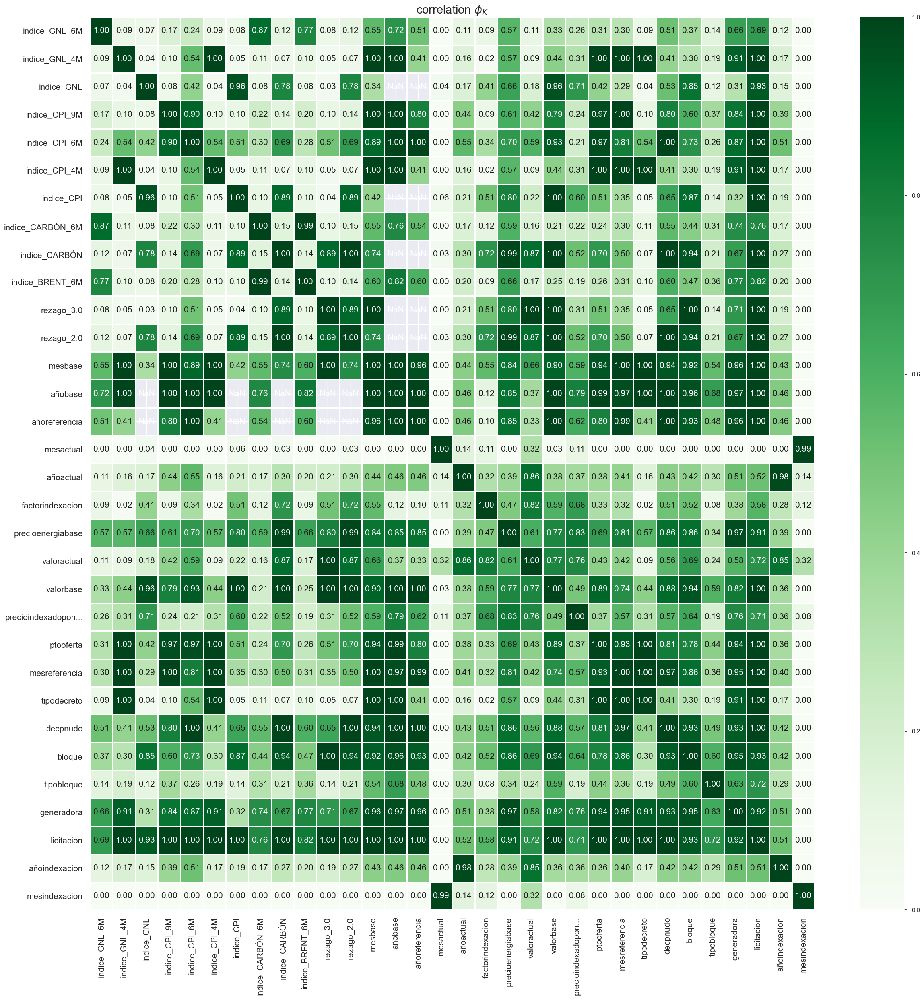

In [161]:
phik_overview = agrupado.phik_matrix()
plot_correlation_matrix(phik_overview.values,
                        x_labels=phik_overview.columns,
                        y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title=r"correlation $\phi_K$",
                        fontsize_factor=1.5,
                        figsize=(25,25))
plt.tight_layout()

<b>Mapa de correlación entre las variables</b>

C:\Users\Asus\AppData\Local\Temp\ipykernel_21128\3720655014.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = agrupado.corr()


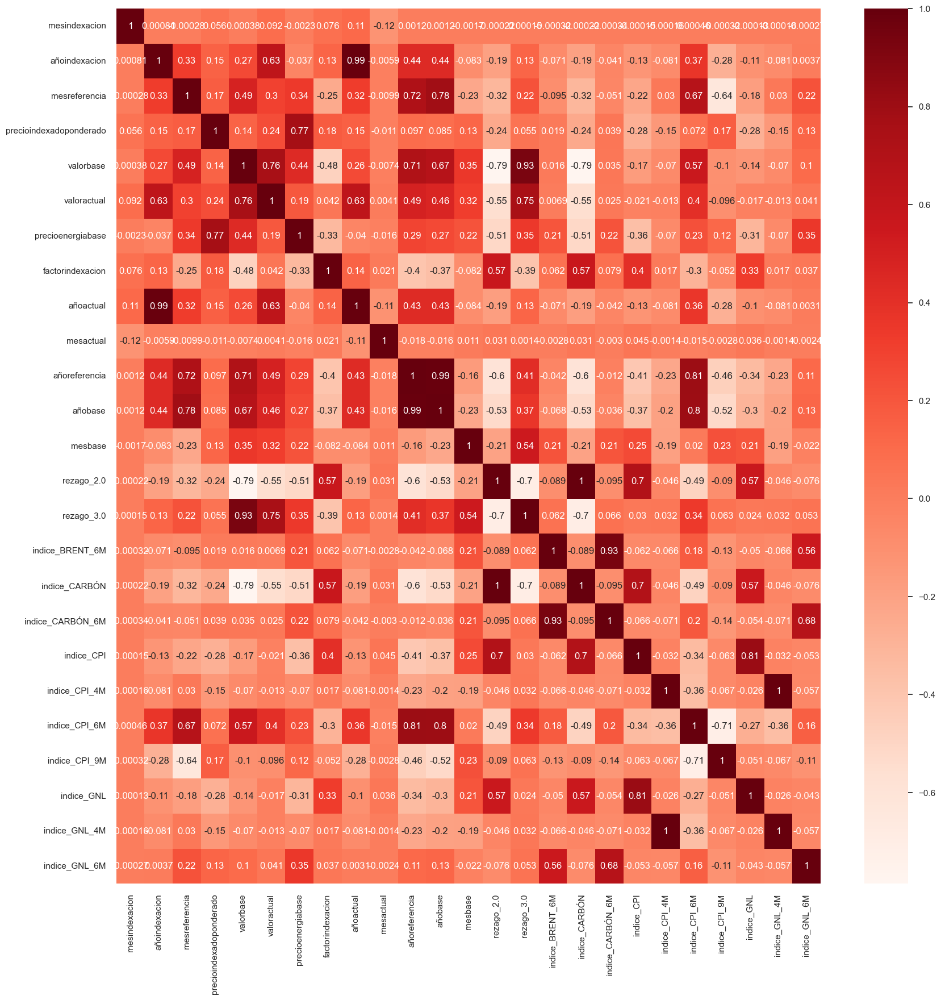

In [ ]:
#Pearson Correlation
plt.figure(figsize=(20,20))
cor = agrupado.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

Del mapa de correlación se puede visualizar que la variable que se quiere predecir en este caso es el 'precioindexadoponderado' presenta una alta correlación principalmente con el precio energía base, lo cual tiene sentido ya que son parte de la fórmula que entrega la normativa para el cálculo del precio, sin embargo, también es evidente que existe una alta correlación entre las variables independientes como el valor actual y valor base, año actual y año indexación, año referencia y mes referencia, en general las fechas de la base de datos presentan una alta correlación entre ellas y también junto con los índices que corresponden a variables dummy, el rezago y los índices entre sí también presentan correlaciones altas. Es importante tener en consideración las altas correlaciones entre las variables independientes para evitar posibles multicolinealidades.

<b>Análisis factorial de datos mixtos</b>

A continuación se realizará un estudio de los datos teniendo en cuenta que la data está compuesta por datos categóricos y cuantitativos.

Se debe trabajar con toda la data excepto la variable que se quiere predecir.

In [ ]:
agrupado.columns

Index(['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'precioindexadoponderado', 'valorbase', 'valoractual',
       'precioenergiabase', 'factorindexacion', 'añoactual', 'mesactual',
       'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0',
       'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI',
       'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL',
       'indice_GNL_4M', 'indice_GNL_6M'],
      dtype='object')

In [ ]:
x=agrupado[['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta',  'valorbase',
       'valoractual', 'precioenergiabase', 'factorindexacion', 'añoactual',
       'mesactual', 'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0',
       'rezago_3.0', 'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M',
       'indice_CPI', 'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M',
       'indice_GNL', 'indice_GNL_4M', 'indice_GNL_6M']]
x

,mesindexacion,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,ptooferta,...,indice_BRENT_6M,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M
0,1,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
1,1,2010,CGED 2008/01,CAMPANARIO,BV,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
2,1,2010,CGED 2008/01,COLBÚN,BB,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
3,1,2010,CGED 2008/01,COLBÚN,BV,BS1,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
4,1,2010,CGED 2008/01,ENDESA,BB,BS2,130/2008,Decreto PN,1,ALTO JAHUEL 220,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16090,12,2022,SIC 2013/03_2 (ENELSA),SAN JUAN SPA.,BB,BS2A,4T/2013,Decreto PN,12,POLPAICO 220,...,0,0,0,0,0,1,0,0,0,0
16091,12,2022,SIC 2013/03_2 (ENELSA),SAN JUAN SPA.,BB,BS2C,4T/2013,Decreto PN,12,POLPAICO 220,...,0,0,0,0,0,1,0,0,0,0
16092,12,2022,SIC 2013/03_2 (ENELSA),SAN JUAN SPA.,BB,BS3,4T/2013,Decreto PN,12,POLPAICO 220,...,0,0,0,0,0,1,0,0,0,0
16093,12,2022,SIC 2013/03_2 (ENELSA),SANTIAGO SOLAR S.A.,BB,BS2B,4T/2013,Decreto PN,12,POLPAICO 220,...,0,0,0,0,0,1,0,0,0,0


In [ ]:
agrupado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16095 entries, 0 to 16094
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mesindexacion            16095 non-null  int64  
 1   añoindexacion            16095 non-null  int64  
 2   licitacion               16095 non-null  object 
 3   generadora               16095 non-null  object 
 4   tipobloque               16095 non-null  object 
 5   bloque                   16095 non-null  object 
 6   decpnudo                 16095 non-null  object 
 7   tipodecreto              16095 non-null  object 
 8   mesreferencia            16095 non-null  int64  
 9   ptooferta                16095 non-null  object 
 10  precioindexadoponderado  16095 non-null  float64
 11  valorbase                16095 non-null  float64
 12  valoractual              16095 non-null  float64
 13  precioenergiabase        16095 non-null  float64
 14  factorindexacion      

In [ ]:
from sklearn.preprocessing import StandardScaler

# Variables numéricas a estandarizar
numerical_vars = ['mesindexacion', 'añoindexacion', 'mesreferencia', 'precioindexadoponderado','valorbase','valoractual','precioenergiabase','factorindexacion','añoactual','mesactual','añoreferencia','añobase','mesbase']

# Crea el objeto StandardScaler
scaler = StandardScaler()

# Estandariza las variables numéricas
agrupado[numerical_vars] = scaler.fit_transform(agrupado[numerical_vars])

# Verificar los cambios
round(agrupado[numerical_vars].describe(),2)


,mesindexacion,añoindexacion,mesreferencia,precioindexadoponderado,valorbase,valoractual,precioenergiabase,factorindexacion,añoactual,mesactual,añoreferencia,añobase,mesbase
count,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00,16095.00
mean,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.59,-2.80,-1.76,-3.23,-5.37,-6.26,-3.19,-0.59,-3.03,-1.60,-2.40,-2.12,-3.13
25%,-0.73,-0.44,-1.28,-0.61,-0.22,-0.35,-0.45,-0.35,-0.69,-0.73,-0.51,-0.74,-0.62
50%,0.14,0.23,0.40,0.08,0.36,0.08,0.11,-0.23,0.31,0.14,0.62,0.65,0.22
75%,1.01,0.91,0.89,0.63,0.44,0.37,0.63,0.03,0.98,1.01,0.62,0.65,0.64
max,1.59,1.24,0.89,9.46,0.44,4.40,1.42,15.12,1.31,1.59,1.37,1.34,1.47


In [ ]:
import prince

In [ ]:
# Crear una instancia de FAMD
famd = prince.FAMD(
    n_components=90,    # Número de componentes para retener
    n_iter=3,          # Número de iteraciones del algoritmo SVD
    copy=True,         # Si es True, los datos se copian; si no, se sobrescriben
    check_input=True,  # Si es True, los datos de entrada se comprueban antes de proceder
    engine='sklearn',     # Motor para utilizar; opciones son 'auto', 'sklearn', 'fbpca'
    random_state=42    # Semilla del generador de números aleatorios para la reproducibilidad
)

# Ajustar los datos
famd = famd.fit(x)

In [ ]:
famd.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,21.851,5.84%,5.84%
1,17.838,4.77%,10.61%
2,15.266,4.08%,14.69%
3,13.616,3.64%,18.33%
4,13.119,3.51%,21.84%
...,...,...,...
85,0.106,0.03%,99.96%
86,0.074,0.02%,99.98%
87,0.043,0.01%,99.99%


In [ ]:
summary_famd = famd.eigenvalues_summary
# Quita el signo de porcentaje y convierte a flotante
summary_famd['% of variance'] = summary_famd['% of variance'].str.rstrip('%').astype('float') / 100.0
summary_famd['% of variance (cumulative)'] = summary_famd['% of variance (cumulative)'].str.rstrip('%').astype('float') / 100.0
summary_famd

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,21.851,0.0584,0.0584
1,17.838,0.0477,0.1061
2,15.266,0.0408,0.1469
3,13.616,0.0364,0.1833
4,13.119,0.0351,0.2184
...,...,...,...
85,0.106,0.0003,0.9996
86,0.074,0.0002,0.9998
87,0.043,0.0001,0.9999


----------------------------------------------------
Porcentaje de varianza explicada por cada componente
----------------------------------------------------
component
0     0.0584
1     0.0477
2     0.0408
3     0.0364
4     0.0351
       ...  
85    0.0003
86    0.0002
87    0.0001
88    0.0000
89    0.0000
Name: % of variance, Length: 90, dtype: float64


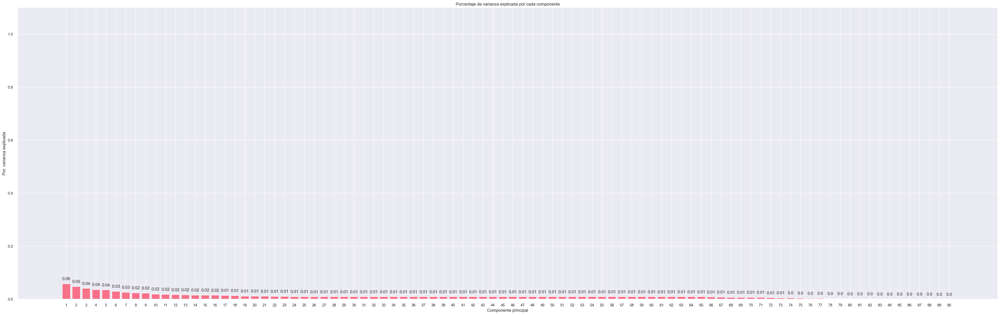

In [ ]:
# Porcentaje de varianza explicada por cada componente
# ==============================================================================
print('----------------------------------------------------')
print('Porcentaje de varianza explicada por cada componente')
print('----------------------------------------------------')
print(summary_famd['% of variance'])

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(50, 15))
ax.bar(
    x      = np.arange(len(summary_famd)) + 1,
    height = summary_famd['% of variance']
)

for x, y in zip(np.arange(len(summary_famd)) + 1, summary_famd['% of variance']):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_xticks(np.arange(len(summary_famd)) + 1)
ax.set_ylim(0, 1.1)
ax.set_title('Porcentaje de varianza explicada por cada componente')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza explicada')
plt.show()

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
component
0     0.0584
1     0.1061
2     0.1469
3     0.1833
4     0.2184
       ...  
85    0.9996
86    0.9998
87    0.9999
88    1.0000
89    1.0000
Name: % of variance (cumulative), Length: 90, dtype: float64


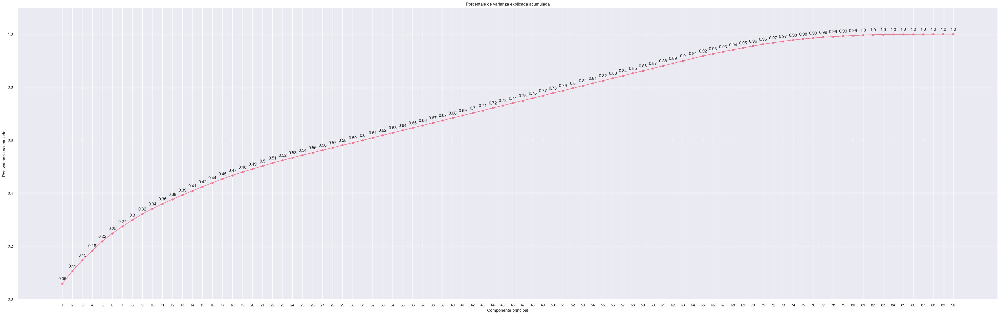

In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = summary_famd['% of variance (cumulative)']
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(50, 15))
ax.plot(
    np.arange(len(summary_famd)) + 1,
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(len(summary_famd)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(len(summary_famd)) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada')
plt.show()


In [ ]:
coordenadas_componentes = famd.column_coordinates_
coordenadas_componentes

component,0,1,2,3,4,5,6,7,8,9,...,80,81,82,83,84,85,86,87,88,89
variable,,,,,,,,,,,,,,,,,,,,,
mesindexacion,0.000016,4.826868e-07,0.000002,0.000002,6.561897e-06,0.000004,0.000005,5.762026e-05,0.000026,1.377139e-07,...,9.603443e-09,8.394313e-03,1.828910e-06,2.771570e-07,6.180123e-08,2.174886e-07,1.430550e-07,6.108148e-05,2.347868e-10,9.263048e-12
añoindexacion,0.214565,1.063966e-02,0.011817,0.000003,1.203055e-02,0.014344,0.000793,2.888981e-02,0.000590,2.535255e-04,...,2.463664e-07,5.190827e-02,2.332473e-05,6.573315e-06,7.918522e-07,4.544132e-06,9.013491e-06,1.410732e-03,1.510895e-09,1.503908e-10
mesreferencia,0.608292,2.200998e-03,0.108651,0.112620,3.501122e-04,0.100097,0.001921,1.792757e-02,0.001325,4.985485e-05,...,9.482099e-07,1.342084e-04,1.772192e-05,5.330478e-05,2.359792e-04,4.939121e-04,4.377407e-05,1.774665e-07,1.650826e-05,1.108598e-05
valorbase,0.608924,1.457910e-01,0.051677,0.001304,5.583021e-04,0.000784,0.097739,1.101229e-04,0.070408,2.086988e-06,...,6.175308e-07,1.090417e-04,1.768087e-08,5.735233e-05,1.496410e-05,4.490290e-06,9.742867e-08,1.319916e-04,5.408671e-08,7.494502e-07
valoractual,0.318834,6.899856e-02,0.020947,0.002301,1.096603e-02,0.014557,0.117581,1.817532e-02,0.084932,3.335726e-05,...,7.483856e-08,2.472570e-02,8.305513e-05,4.775088e-05,1.679421e-05,1.331178e-04,1.405891e-04,3.256495e-02,6.305328e-08,9.903751e-10
precioenergiabase,0.115602,2.032420e-01,0.164939,0.058657,6.689548e-02,0.113873,0.028752,9.699469e-02,0.001300,4.577040e-02,...,1.407320e-03,2.712107e-05,2.277967e-04,1.782408e-03,2.346597e-04,1.534479e-04,4.511188e-04,1.196651e-06,1.460725e-05,5.607833e-04
factorindexacion,0.181148,9.786643e-02,0.021795,0.003121,3.047255e-03,0.001403,0.002691,2.819702e-03,0.031951,1.856980e-05,...,7.677548e-07,3.517658e-01,3.502078e-05,1.125915e-06,9.651727e-07,3.063503e-05,3.447303e-05,5.707993e-03,4.589770e-09,4.624005e-10
añoactual,0.207414,1.125094e-02,0.012067,0.000005,1.180937e-02,0.014018,0.000834,2.862434e-02,0.000675,2.491712e-04,...,2.173529e-07,5.186184e-02,2.331689e-05,7.838192e-06,7.832035e-07,4.845756e-06,8.687558e-06,1.412222e-03,1.863031e-09,1.890182e-10
mesactual,0.000422,2.512378e-04,0.000022,0.000008,1.979653e-06,0.000009,0.000216,9.078611e-06,0.001425,1.256215e-06,...,6.672716e-08,5.909753e-03,1.189535e-06,8.317118e-08,2.801465e-08,1.169875e-07,1.986895e-07,3.535221e-05,5.681591e-11,7.671353e-13


In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import prince
import numpy as np
from sklearn.mixture import GaussianMixture
import plotly.graph_objects as go
import plotly.graph_objects as go

# Transpone el DataFrame para que los nombres de las variables sean las columnas
coordenadas_componentes_transposed = coordenadas_componentes.T

# Gráfico 2D con Plotly
trace = go.Scatter(x=coordenadas_componentes_transposed.loc[0],
                   y=coordenadas_componentes_transposed.loc[1],
                   mode='markers+text',
                   text=coordenadas_componentes_transposed.columns,
                   textposition='top center')
layout = go.Layout(title='Gráfico 2D',
                   xaxis=dict(title='Component 1'),
                   yaxis=dict(title='Component 2'),height=1000)
fig2d = go.Figure(data=[trace], layout=layout)
fig2d.show()


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Se realiza un FAMD en dos dimensiones inicialmente.

In [ ]:
agrupado.columns

Index(['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'precioindexadoponderado', 'valorbase', 'valoractual',
       'precioenergiabase', 'factorindexacion', 'añoactual', 'mesactual',
       'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0',
       'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI',
       'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL',
       'indice_GNL_4M', 'indice_GNL_6M'],
      dtype='object')

In [ ]:
x=agrupado.drop('precioindexadoponderado', axis=1)

In [ ]:
famd = FAMD(n_components =2, n_iter = 3, random_state = 101)
famd.fit(x)
famd.transform(x)

component,0,1
0,5.586969,5.847907
1,6.151069,6.558174
2,5.493374,6.009077
3,6.057474,6.719344
4,5.192657,4.732098
...,...,...
16090,-4.134220,-1.067560
16091,-4.132098,-1.077043
16092,-4.083817,-0.918188
16093,-4.006362,-1.184944


Se genera el dataframe con las componentes principales.

In [ ]:
proyeccion=pd.DataFrame(famd.row_coordinates(x))
proyeccion

component,0,1
0,5.586969,5.847907
1,6.151069,6.558174
2,5.493374,6.009077
3,6.057474,6.719344
4,5.192657,4.732098
...,...,...
16090,-4.134220,-1.067560
16091,-4.132098,-1.077043
16092,-4.083817,-0.918188
16093,-4.006362,-1.184944


Se incorporan las variables categóricas para gráficar posteriormente.

In [ ]:
extracted_col_licitacion = agrupado["licitacion"]
extracted_col_bloque = agrupado["bloque"]
extracted_col_generadora = agrupado["generadora"]
proyeccion = proyeccion.join(extracted_col_licitacion)
proyeccion = proyeccion.join(extracted_col_bloque)
proyeccion = proyeccion.join(extracted_col_generadora)
proyeccion

,0,1,licitacion,bloque,generadora
0,5.586969,5.847907,CGED 2008/01,BS1,CAMPANARIO
1,6.151069,6.558174,CGED 2008/01,BS1,CAMPANARIO
2,5.493374,6.009077,CGED 2008/01,BS1,COLBÚN
3,6.057474,6.719344,CGED 2008/01,BS1,COLBÚN
4,5.192657,4.732098,CGED 2008/01,BS2,ENDESA
...,...,...,...,...,...
16090,-4.134220,-1.067560,SIC 2013/03_2 (ENELSA),BS2A,SAN JUAN SPA.
16091,-4.132098,-1.077043,SIC 2013/03_2 (ENELSA),BS2C,SAN JUAN SPA.
16092,-4.083817,-0.918188,SIC 2013/03_2 (ENELSA),BS3,SAN JUAN SPA.
16093,-4.006362,-1.184944,SIC 2013/03_2 (ENELSA),BS2B,SANTIAGO SOLAR S.A.


Luego se grafica.

In [ ]:
fig = px.scatter(proyeccion, x=0, y=1, color=proyeccion['bloque'], width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Bloque', labels={'0': 'PC 1', '1': 'PC 2'} )
fig.show()

Algunas agrupaciones:

*   BS1
*   BS1-BS2
*   BS3
*   BB1
*   BBNORTE-BBSUR
*   BB1-BB2
*   BS5-BS4-BS6
*   BS1-BS2-BS1B-BS1C-BS3-BS2B-BS2C-BS4B-BS4C-BS2A-BS4A

Las siguientes agrupaciones pueden estar dadas según el tipo de tecnologia implicado, sin embargo se visualiza mejor en tres dimensiones y se agrupan de manera similar, por ende se realizará un análisis de esto más adelante.

In [ ]:
fig = px.scatter(proyeccion, x=0, y=1, color=proyeccion['licitacion'], width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Licitación', labels={'0': 'PC 1', '1': 'PC 2'} )
fig.show()

Algunas agrupaciones:

*   EMELSING 2008/01(ELECDA)
*   CGED 2008/01
*   CHQ 2008/01
*   CHQ 2010/01
*   CHL 2006/02-2
*   CHL 2010/01
*   CHQ 2006/01
*   EMELSIC 2006/01-2- EMEL SIC 2006/01-2 (EMETAL)- EMELSIC 2006/01-2 (EMELECTRIC)
*   SIC 2013/01 (EMELECTRIC)- SIC 2013/01 (ENELSA)- SIC 2013/01- SIC 2013/01 (EMETAL)- SIC 2013/01(ENELSA)-SIC 2013/03(EMELECTRIC)- SIC2013/03-SIC2013/03(ENELSA)-SIC2013/03(EMETAL)
*   SIC2013/03_2-SIC2013/03_2(EMELECTRIC)-SIC2013/03_2(EMETAL)-SIC2013/03_2(ENELSA)-SIC2013/03_2
*   2015/01-2015/02(ELECDA)-2015/02-SIC2013/03_2-SIC2013/03_2(EMELECTRIC)-SIC2013/03_2-SIC 2013/03_2(EMETAL)-SIC2013/03_2(ENELSA)

Los datos se agrupan según el proceso licitatorio, al igual que en el caso anterior se agrupa de manera similar al de tres dimensiones donde se visualiza de mejor manera la distribución.
Este tipo de agrupamiento puede estar sujeto al tipo de índice que se utiliza en cada fórmula para determinar el precio.

In [ ]:
fig = px.scatter(proyeccion, x=0, y=1, color=proyeccion['generadora'], width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Generadora', labels={'0': 'PC 1', '1': 'PC 2'} )
fig.show()

Algunas agrupaciones:

*   E-CL
*   CAMPANARIO-M.REDONDO-COLBÚN
*   ENDESA
*   AES GENER
*   AES GENER-ENDESA
*   PUYEHUE-PANGUIPULLI-ENDESA
*   ENDESA-PANGUIPULLI
*   IBEREOLICA CABO LEONES II S.A.-CONDOR ENERGÍA (ESPERANZA)- CONDOR ENERGÍA (C°TIGRE)- HUEMUL ENERGÍA (CAMAN)- HUEMUL ENERGÍA (CKANI)- EL CAMPESINO- SPV 4 S.A.- EMPRESA ELÉCTRICA ERNC-1 SPA- CHUNGUNGO S.A.-ACCIONA- SAN JUAN SPA.-PELUMPÉN S.A.(COLBÚN)-SANTIAGO SOLAR S.A.-WPD MALLECO(MALLECO)-AELA GENERACIÓN S.A.-IBEREOLICA CABO LEONES I S.A.-CONSORCIO ABENGOA CHILE S.A.,ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A.-AELA GENERACIÓN S.A.-BESALCO-WPD DUQUECO(STA FE)- SAN JUAN SPA.-EMPRESA ELÉCTRICA CARÉN S.A.-ENERGÍA CERRO EL MORADO S.A-EMPRESA ELECTRICA ERNC-1 SPA-MARIA ELENA SOLAR

Observando los patrones se tiene que se están agrupando según el índice, donde se tiene que:

*   Endesa es la única generadora que utiliza el índice Brent 6 meses, Cpi 4 meses y Gnl, se puede observar esta argupación en celeste.
*   Otra agrupacion es Aes Gener y Endesa que se encuentran en naranjo y verde, estas generadoras tienen en común que utilizan índice Carbón y Cpi.
*   E-cl es la única generadora que utiliza Gnl 4meses y se encuentra agrupada en celeste.
*   En cuanto a los grupos que contienen diversas generadoras se explica porque todas las generadoras utilizan el índice cpi 6 meses, en menor proporción Aes Gener, E-cl, Endesa. Campanario, Colbún y M. Redondo no utilizan este índice y se encuentran juntos en otro grupo en color morado y rojo.


Se sigue el mismo procedimiento anterior pero esta vez en tres dimensiones.

In [ ]:
famd = FAMD(n_components =3, n_iter = 3, random_state = 101)
famd.fit(x)
famd.transform(x)

component,0,1,2
0,5.600387,5.916073,-2.381090
1,6.163345,6.632999,-3.172451
2,5.515794,6.007962,-2.523720
3,6.078753,6.724887,-3.315081
4,5.219677,4.761402,-2.482220
...,...,...,...
16090,-4.147264,-1.209093,1.532741
16091,-4.134274,-1.206086,1.538331
16092,-4.092279,-0.937879,1.300564
16093,-4.004347,-1.125010,1.283250


Se genera el dataframe con las componentes principales.

In [ ]:
proyeccion_2=pd.DataFrame(famd.row_coordinates(x))
proyeccion_2

component,0,1,2
0,5.600387,5.916073,-2.381090
1,6.163345,6.632999,-3.172451
2,5.515794,6.007962,-2.523720
3,6.078753,6.724887,-3.315081
4,5.219677,4.761402,-2.482220
...,...,...,...
16090,-4.147264,-1.209093,1.532741
16091,-4.134274,-1.206086,1.538331
16092,-4.092279,-0.937879,1.300564
16093,-4.004347,-1.125010,1.283250


In [ ]:
x.columns

Index(['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'valorbase', 'valoractual', 'precioenergiabase',
       'factorindexacion', 'añoactual', 'mesactual', 'añoreferencia',
       'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0', 'indice_BRENT_6M',
       'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M',
       'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M',
       'indice_GNL_6M'],
      dtype='object')

In [ ]:
extracted_col_licitacion2 = agrupado["licitacion"]
extracted_col_bloque2 = agrupado["bloque"]
extracted_col_generadora2 = agrupado["generadora"] 
extracted_col_generadora2 = agrupado["generadora"] 
extracted_col_ind = agrupado[['indice_BRENT_6M',
       'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M',
       'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M',
       'indice_GNL_6M']]
proyeccion_2 = proyeccion_2.join(extracted_col_licitacion2)
proyeccion_2 = proyeccion_2.join(extracted_col_bloque2)
proyeccion_2 = proyeccion_2.join(extracted_col_generadora2)
proyeccion_2 = proyeccion_2.join(extracted_col_ind)
proyeccion_2

,0,1,2,licitacion,bloque,generadora,indice_BRENT_6M,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M
0,5.600387,5.916073,-2.381090,CGED 2008/01,BS1,CAMPANARIO,0,0,0,0,0,0,1,0,0,0
1,6.163345,6.632999,-3.172451,CGED 2008/01,BS1,CAMPANARIO,0,0,0,0,0,0,1,0,0,0
2,5.515794,6.007962,-2.523720,CGED 2008/01,BS1,COLBÚN,0,0,0,0,0,0,1,0,0,0
3,6.078753,6.724887,-3.315081,CGED 2008/01,BS1,COLBÚN,0,0,0,0,0,0,1,0,0,0
4,5.219677,4.761402,-2.482220,CGED 2008/01,BS2,ENDESA,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16090,-4.147264,-1.209093,1.532741,SIC 2013/03_2 (ENELSA),BS2A,SAN JUAN SPA.,0,0,0,0,0,1,0,0,0,0
16091,-4.134274,-1.206086,1.538331,SIC 2013/03_2 (ENELSA),BS2C,SAN JUAN SPA.,0,0,0,0,0,1,0,0,0,0
16092,-4.092279,-0.937879,1.300564,SIC 2013/03_2 (ENELSA),BS3,SAN JUAN SPA.,0,0,0,0,0,1,0,0,0,0
16093,-4.004347,-1.125010,1.283250,SIC 2013/03_2 (ENELSA),BS2B,SANTIAGO SOLAR S.A.,0,0,0,0,0,1,0,0,0,0


Luego se grafica.

In [ ]:
fig = px.scatter_3d(
    proyeccion_2, x=0, y=1, z=2, color=proyeccion_2['bloque'],  width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Bloque',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

Algunas agrupaciones:

*   BB1-BB2
*   BBNORTE-BBSUR
*   BS6-BS4-BS5
*   BS2A-BS2C-BS2B-BS3-BS4B-BS1B
*   BS2-BS1

Las siguientes agrupaciones pueden estar dadas según las tecnologías asociadas a cada bloque de suministro, por ejemplo se visualiza:

*   Bloque base 1 y 2 son bloque de suministro de 24 horas.
*   Los bloques A, B, C surgieron debido al incentivo de nuevas tecnologías, donde la idea es que no funcione solamente un bloque por 24 horas, estos corresponden a rangos horarios durante el día.
*   BBNORTE y BBSUR son tecnologías más antiguas.

In [ ]:
fig = px.scatter_3d(
    proyeccion_2, x=0, y=1, z=2, color=proyeccion_2['licitacion'],  width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Licitación',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

Algunas agrupaciones:

*   EMELSIC2006/01-2- EMELSIC2006/01-2(EMETAL)- EMELSIC 2006/01-2(EMELECTRIC)
*   CHQ 2006/01
*   CHL2006/02-2
*   CHQ2008/01
*   CGED 2008/01
*   CHQ2010/01
*   CHL2010/01
*   EMELSING 2008/01- EMELSING 2008/01(ELECDA)
*   SIC 2013/03 (EMELECTRIC)- SIC 2013/03 (ENELSA)
*   SIC 2013/03_2(EMELECTRIC) - SIC 2013/03_2(ENELSA)- SIC 2013/03_2 (EMETAL)
*   2015/01- 2015/02(ELECDA)- 2015/02
*   SIC2013/01(ENELSA)- SIC2013/01(EMETAL)- SIC2013/01(EMELECTRIC)

A continuación es posible observar que los datos se están agrupando según el proceso licitatorio, esto también podría estar dado según el tipo de índice, puesto que cada una posee una fórmula de indexación estructuradas de manera distinta, aplicable a los precios nudo de la energía en el punto de oferta, por ejemplo:

*   EMELSING 2008/01 está estructurada con PGNL 4 meses y CPI 4 meses, se encuentra agrupado en rosado y verde.
*   En el caso de SIC 2013/03 está estructurada con Carbón 6 meses, Brent 6 meses. PGNL 6 meses y CPI 6meses.
*   Para SIC 2013/03-2 está estructurada con CPI 6 meses, Carbon 6 meses y PGNL 6 meses.


También de las gráficas anteriores es posible desprender que las agrupaciones tienen en común el tiempo de vigencia debido al proceso licitatorio.


In [ ]:
fig = px.scatter_3d(
    proyeccion_2, x=0, y=1, z=2, color=proyeccion_2['generadora'],  width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Generadora',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

Algunas agrupaciones:

*   AES GENER
*   ENDESA
*   AESGENER- ENDESA
*   ENDESA- PANGUIPULLI- PUYEHUE
*   COLBUN- M. REDONDO-CAMPANARIO
*   E-CL
*   ENDESA- PANGUIPULLI
*   ENDESA-PANGUIPULLI-PUYEHUE
*   ELCAMPESINO- NORVIND- ABENGOA
*   IBEREOLICA CABO LEONES I S.A- CONSORCIO ABENGOA CHILE S.S.-ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A.- IBEREOLICA CABO LEONES III SPA-WD MALLECO(MALLECO)-WPD MALLECO(MALLECOII)- SONNEDIX COX- SCB II SPA- AMUNCHE SOLAR SPA- ACCIONA- WPD NEGRETE
*   CONDOR ENERGÍA (ESPERANZA)- WPD MALLECO(MALLECO)- WPD MALLECO(MALLECOII)-WPD NEGRETE-IBEREOLICA CABO LEONES II S.S- CONDOR ENERGIA (C|TIGRE)- ODENERGY- HUEMUL ENERGIA (CKANI)-CONDORENERGIA (TCHAMMA)

Al igual que en el caso 2D es posible observar que los patrones de agrupamiento pueden estar dados por los índices, por ejemplo:

*   Endesa es la única generadora que utiliza el índice Brent 6 meses, Cpi 4 meses y Gnl, se puede observar esta argupación en verde.
*   Otra agrupacion es Aes Gener y Endesa que se encuentran en naranjo y verde, estas generadoras tienen en común que utilizan índice Carbón y Cpi.
*   E-cl es la única generadora que utiliza Gnl 4meses y se encuentra agrupada en celeste.
*   En cuanto a los grupos que contienen diversas generadoras se explica porque todas las generadoras utilizan el índice cpi 6 meses, en menor proporción Aes Gener, E-cl, Endesa. Campanario, Colbún y M. Redondo no utilizan este índice y se encuentran juntos en otro grupo en color azul y rojo, además las tres generadoras ofertan en una misma porporción en un tipo de bloque base y variable.


In [ ]:
x.columns

Index(['mesindexacion', 'añoindexacion', 'licitacion', 'generadora',
       'tipobloque', 'bloque', 'decpnudo', 'tipodecreto', 'mesreferencia',
       'ptooferta', 'valorbase', 'valoractual', 'precioenergiabase',
       'factorindexacion', 'añoactual', 'mesactual', 'añoreferencia',
       'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0', 'indice_BRENT_6M',
       'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M',
       'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M',
       'indice_GNL_6M'],
      dtype='object')

In [ ]:
fig = px.scatter_3d(
    proyeccion_2, x=0, y=1, z=2, color=proyeccion_2['indice_CPI_6M'],  width=1500, height=950,
    title=f'Factor Analysis Of Mixed Data: Generadora',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

Conclusiones generales FAMD